In [1]:
import matplotlib.pyplot as plt
import seaborn as sns
import os
import matplotlib.patches as mpatches
import pandas as pd
import numpy as np
import tifffile
import pre_process_mm as pre
import mm3_adapted_cell_segmentation as mm3seg
import mm3_adapted_cell_tracking as mm3track
import plot_cells
from scipy.optimize import curve_fit

In [ ]:
# starting at t= 25 for fov 005, fov 018 starting at t = 0

seg_FOV_dict = {'DUMM_giTG62_Glucose_012925': 
            {'005': ['445', '900', '1128', '1277', '1887',  '2115', '2344', '2421', '2497'],
             '018':['1940', '1483']
            }
           }

In [ ]:
phase_channel = '0'
fluor_channel = '1'
for folder, fov_dict in seg_FOV_dict.items():
    for fov_id in fov_dict.keys():
        ana_peak_ids = fov_dict[fov_id]
        for peak_id in ana_peak_ids:
            path_to_phase_stack = f'/Users/noravivancogonzalez/Documents/DuMM_image_analysis/{folder}/hyperstacked/drift_corrected/rotated/mm_channels/subtracted/subtracted_FOV_{fov_id}_region_{peak_id}_c_{phase_channel}.tif'
            path_to_fluor_stack = f'/Users/noravivancogonzalez/Documents/DuMM_image_analysis/{folder}/hyperstacked/drift_corrected/rotated/mm_channels/subtracted/subtracted_FOV_{fov_id}_region_{peak_id}_c_{fluor_channel}.tif'
            output_path = f'/Users/noravivancogonzalez/Documents/DuMM_image_analysis/{folder}/hyperstacked/drift_corrected/rotated/mm_channels/subtracted/outputs'
            mm3seg.segment_chnl_stack(path_to_phase_stack,
                   output_path,
                   OTSU_threshold=1.5,
                   first_opening=2,
                   distance_threshold=1,
                   second_opening_size=1,
                   min_cell_area=200,
				   max_cell_area=600,
                   small_merge_area_threshold=200)
            labeled_stack = f'/Users/noravivancogonzalez/Documents/DuMM_image_analysis/{folder}/hyperstacked/drift_corrected/rotated/mm_channels/subtracted/mm3_segmented_subtracted_FOV_{fov_id}_region_{peak_id}_c_{phase_channel}.tif'
            plot_cells.display_segmentation(path_to_phase_stack, mask_path = labeled_stack, start=28, end=170, alpha=0.5)

In [211]:
def cell_color_dict(cells_df):
    color_dict = {}
    unique_cell_ids = cells_df['cell_id'].unique()
    total_number_labels = len(unique_cell_ids)
    number_of_colors_needed = max(20, total_number_labels)
    # Get a colormap with  distinct colors, for potential cell labels
    cmap = plt.colormaps['tab20'](np.linspace(0, 1, number_of_colors_needed))
    # Create a dictionary mapping integers to hex color codes
    for color_i, cell_id in enumerate(unique_cell_ids):
        color = cmap[color_i, :3]  # Extract RGB values
        color_dict[cell_id] = color
    return color_dict

In [3]:
# select cells starting at t= 28 for fov 005
lineage_FOV_dict = {'DUMM_giTG62_Glucose_012925': 
            {'005': ['445', '900', '1128', '1277', '1887',  '2115', '2344', '2421', '2497']
            }
           }

445
900
1128
1277
1887
2115
2344
2421
2497


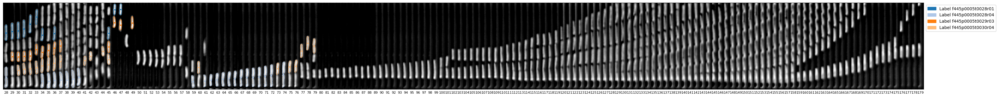

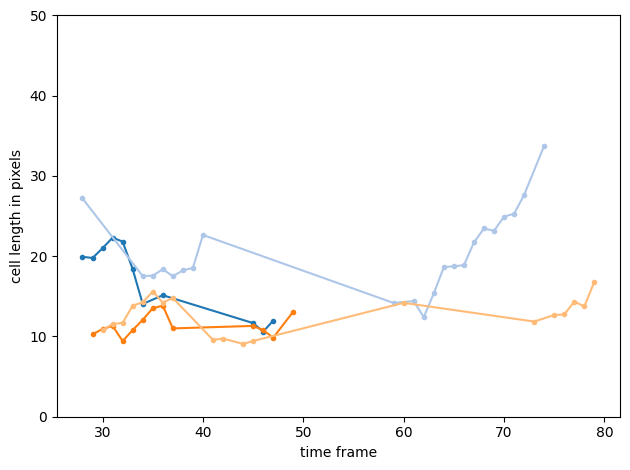

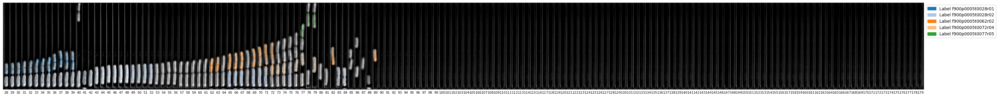

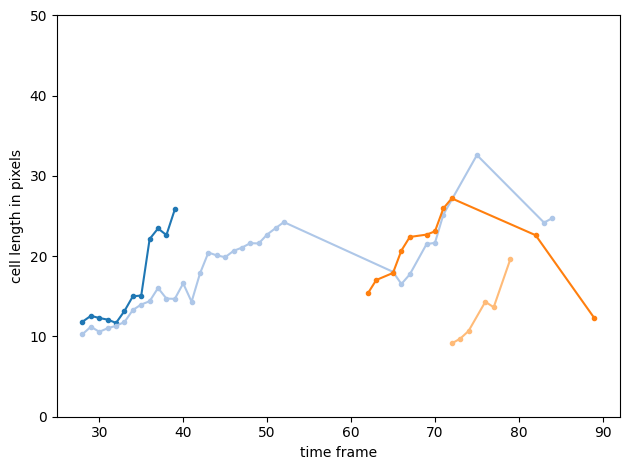

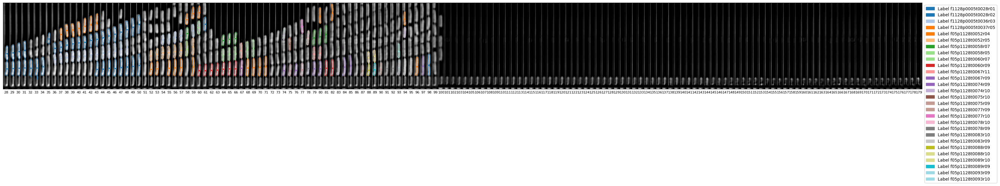

...

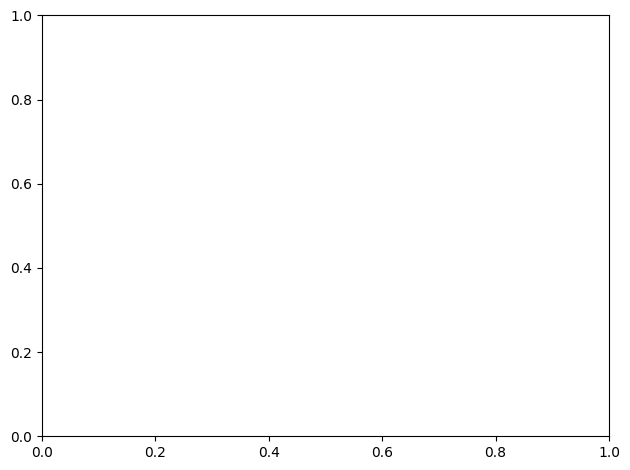

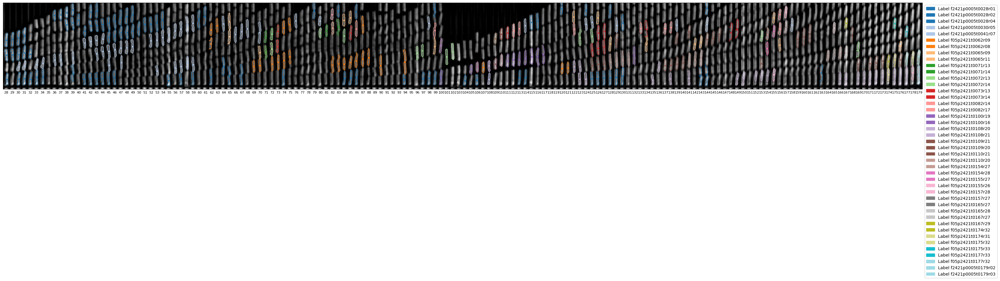

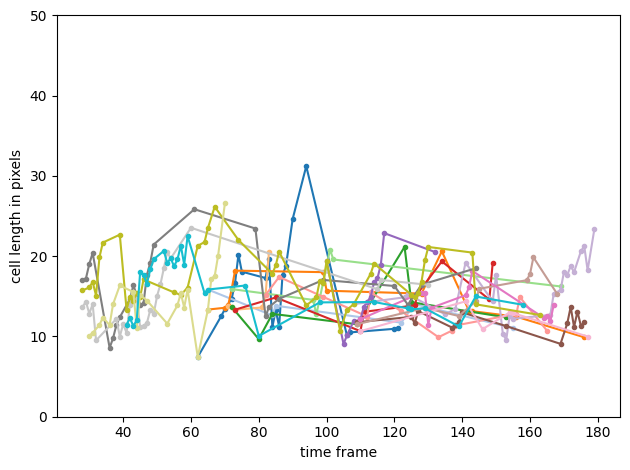

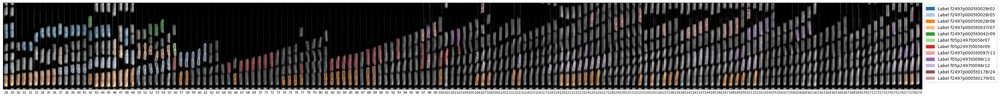

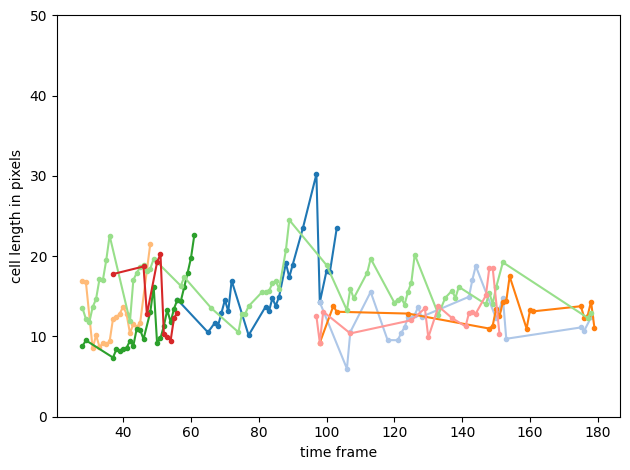

In [6]:
phase_channel = '0'
fluor_channel = '1'
all_cells_pd = pd.DataFrame()
for folder, fov_dict in lineage_FOV_dict.items():
    for fov_id in fov_dict.keys():
        ana_peak_ids = fov_dict[fov_id]
        for peak_id in ana_peak_ids:
            print(peak_id)
            path_to_phase_stack = f'/Users/noravivancogonzalez/Documents/DuMM_image_analysis/{folder}/hyperstacked/drift_corrected/rotated/mm_channels/subtracted/subtracted_FOV_{fov_id}_region_{peak_id}_c_{phase_channel}.tif'
            path_to_fluor_stack = f'/Users/noravivancogonzalez/Documents/DuMM_image_analysis/{folder}/hyperstacked/drift_corrected/rotated/mm_channels/subtracted/subtracted_FOV_{fov_id}_region_{peak_id}_c_{fluor_channel}.tif'
            labeled_stack = f'/Users/noravivancogonzalez/Documents/DuMM_image_analysis/{folder}/hyperstacked/drift_corrected/rotated/mm_channels/subtracted/mm3_segmented_subtracted_FOV_{fov_id}_region_{peak_id}_c_{phase_channel}.tif'
            cells_dict = mm3track.make_lineage_chnl_stack(labeled_stack = labeled_stack, 
                                              fov_id = int(fov_id), 
                                              peak_id = int(peak_id), 
                                              pxl2um = 1,
                                              start_frame = 28)
            mm3track.find_cell_intensities(path_to_fluor_stack, labeled_stack, cells_dict, midline=False, start_frame = 28)
            fig_kymograph = plot_cells.display_cells_from_dict(path_to_phase_stack, cells_dict, start=28, end = 180)
            plot_filename = f'/Users/noravivancogonzalez/Documents/DuMM_image_analysis/{folder}/hyperstacked/drift_corrected/rotated/mm_channels/FOV_{fov_id}_region_{peak_id}_kymograph.png'
            plt.savefig(plot_filename, dpi=300)
            cells_pd = mm3track.cells2df(cells_dict, num_time_frames = 5)
            cells_pd['experiment'] = folder
            cells_pd['FOV'] = fov_id
            cells_pd['peak_id'] = peak_id
            if not cells_pd.empty:
                if all_cells_pd.empty:
                    all_cells_pd = cells_pd  
                else:
                    all_cells_pd = pd.concat([all_cells_pd, cells_pd], ignore_index=True)
            else:
                print(f"Warning: cells_pd is empty for folder: {folder}, fov_id: {fov_id}, peak_id: {peak_id}")
            color_dict = cell_color_dict(cells_pd)
            fig_growth, ax = plt.subplots()
            for cell_id, color in color_dict.items():
                cell_df = cells_pd[(cells_pd['cell_id'] == cell_id)]
                ax.plot(cell_df['time_index'], cell_df['lengths_(pxls)'], marker='.', color = color) 
                ax.set_xlabel('time frame')
                ax.set_ylim(0, 50)
                ax.set_ylabel('cell length in pixels')  
            plt.tight_layout()
            plot_filename = f'/Users/noravivancogonzalez/Documents/DuMM_image_analysis/{folder}/hyperstacked/drift_corrected/rotated/mm_channels/FOV_{fov_id}_region_{peak_id}_curve.png'
            plt.savefig(plot_filename, dpi=300)
all_cells_filename = f'/Users/noravivancogonzalez/Documents/DuMM_image_analysis/{folder}/hyperstacked/drift_corrected/rotated/mm_channels/all_cell_data.csv'
all_cells_pd.to_csv(all_cells_filename)

In [14]:
# Evalutate growth curves

In [44]:
from sklearn.metrics import r2_score, mean_squared_error
from scipy.signal import find_peaks

In [16]:
cell_df = all_cells_pd[(all_cells_pd['peak_id'] == '1128') & (all_cells_pd['cell_id'] == 'f1128p0005t0036r03')]

In [17]:
def modified_exponential(x, a, b, c):
    return a * np.exp(b*x) + c
def exponential_growth_rate(x, a, b, c): # x is time, a, b and c are fitted parameters
    """Instantaneous growth rate for an exponential function."""
    return a * b * np.exp(b * x) # The growth rate changes over time for an exponential function

In [18]:
def evaluate_fit(y_data, y_fit):
    """Evaluates the goodness of fit using R-squared and MSE."""
    r_squared = r2_score(y_data, y_fit)
    mse = mean_squared_error(y_data, y_fit)
    return r_squared, mse

In [140]:
def fit_cell_growth(df, time_col, length_col, start_time, end_time):
    """Fits exponential functions to cell growth phases.

    Args:
        df: Pandas DataFrame with time and length data.
        time_col: Name of the time column.
        length_col: Name of the length column.
        start_time: Start time of the growth phase.
        end_time: End time of the growth phase.

    Returns:
        popt: Optimized parameters from curve_fit.
        pcov: Covariance matrix from curve_fit.
        y_fit: Fitted y-values.
        r_squared: R-squared value of the fit.
    """

    df_growth = df[(df[time_col] >= start_time) & (df[time_col] <= end_time)]
    x_data = df_growth[time_col].values
    y_data = df_growth[length_col].values

    # Initial guesses (important for exponential fits)
    A_guess = 0.1  # Amplitude
    k_guess = (1/20) 
    b_guess = np.min(y_data)  # Offset

    p0 = [A_guess, k_guess, b_guess]

    lower_bounds = [0, 1/20, 0]  # a, b, c
    upper_bounds = [np.inf, 1/5, np.inf] # a, b, c

    try:
        popt, pcov = curve_fit(modified_exponential, x_data, y_data, p0=p0, 
                               #bounds=(lower_bounds, upper_bounds), 
                               maxfev=5000)
        
        y_fit = modified_exponential(x_data, *popt)
        
        r_squared, mse = evaluate_fit(y_data, y_fit)

        return popt, pcov, y_fit, r_squared
    except RuntimeError as e:
        print(f"Error during curve fitting: {e}")
        return None, None, None, None

In [135]:
def detect_growth_phases_peaks_smoothed(df, time_col, length_col, prominence=0.5, distance=5, window_size=3):
    """Detects growth phases using peak detection on the smoothed derivative."""
    df_copy = df.copy()
    df_copy = df_copy.reset_index(drop=True)

    df_copy['smoothed_length'] = df_copy[length_col].rolling(window=window_size, center=True).mean()
    df_copy['diff'] = df_copy['smoothed_length'].diff()

    peaks, _ = find_peaks(df_copy['diff'].values, prominence=prominence, distance=distance)
    growth_phases = []
    last_end_index = -1  # Keep track of the last end index

    for peak_index in peaks:
        if peak_index > last_end_index: #Check if the peak is after the last end
            # Find the start and end of the growth phase around the peak
            peak_time = df_copy[time_col].iloc[peak_index]

            # Search for the start time
            start_index = peak_index
            while start_index > 0 and df_copy['diff'].iloc[start_index] > 0:
                start_index -= 1
            start_time = df_copy[time_col].iloc[start_index]

            # Search for the end time
            end_index = peak_index
            while end_index < len(df_copy) - 1 and df_copy['diff'].iloc[end_index] > 0:
                end_index += 1
            end_time = df_copy[time_col].iloc[end_index]

            growth_phases.append((start_time, end_time))
            last_end_index = end_index #Update the last end index

    return growth_phases

In [200]:
def plot_growth_analysis(cell_df, time_col, length_col, prominence=0.3, distance=3, window_size=3):
    """Analyzes and plots cell growth data, returning the DataFrame with fit data.

    Args:
        cell_df (pd.DataFrame): DataFrame containing cell data.
        time_col (str): Name of the time column.
        length_col (str): Name of the length column.
        prominence (float): Prominence parameter for peak detection.
        distance (int): Distance parameter for peak detection.
        window_size (int): Window size for smoothing.

    Returns:
        pd.DataFrame: The input DataFrame with added 'y_fit' and 'r_squared' columns.
                           'y_fit' will be NaN outside of fitted regions.
                           'r_squared' will be NaN outside of fitted regions.
    """

    growth_phases = detect_growth_phases_peaks_smoothed(cell_df, time_col, length_col, prominence, distance, window_size)

    # Initialize new columns with NaN
    cell_df['y_fit'] = np.nan
    cell_df['residuals'] = np.nan
    cell_df['r_squared'] = np.nan
    cell_df['growth_phase'] = None

    plt.figure(figsize=(10, 6))

    # Plot entire cell data first, behind everything else
    plt.plot(cell_df[time_col], cell_df[length_col], 'o', color='grey', alpha=0.5, label='Entire cell data')

    if growth_phases:
        for i, (start, end) in enumerate(growth_phases):
            print(f"Fitting growth phase {i+1} from {start} to {end}")

            cell_growth_data = cell_df[(cell_df[time_col] >= start) & (cell_df[time_col] <= end)]
            
            if len(cell_growth_data) < 3: #Check for phases with less than 3 points
                print(f"Skipping phase {i+1} ({start}-{end}) due to insufficient data points.")
                continue #Skip to the next iteration of the loop

            popt, pcov, y_fit, r_squared = fit_cell_growth(cell_growth_data, time_col, length_col, start, end)


            if popt is not None:
                print(f"  Fit parameters: A={popt[0]:.2f}, k={popt[1]:.4f}, b={popt[2]:.2f}")
                print(f"  R-squared: {r_squared:.4f}")
                residuals = cell_growth_data[length_col].values - y_fit
                 
                r_squared_threshold = 0.3
                if r_squared < r_squared_threshold:
                    print(f"Skipping phase {i+1} ({start}-{end}) due to poor fit (R-squared = {r_squared:.4f} < {r_squared_threshold}).")
                    continue 

                # Store y_fit and r_squared in the original DataFrame
                cell_df.loc[(cell_df[time_col] >= start) & (cell_df[time_col] <= end), 'y_fit'] = y_fit
                cell_df.loc[(cell_df[time_col] >= start) & (cell_df[time_col] <= end), 'residuals'] = residuals
                cell_df.loc[(cell_df[time_col] >= start) & (cell_df[time_col] <= end), 'r_squared'] = r_squared
                cell_df.loc[(cell_df[time_col] >= start) & (cell_df[time_col] <= end), 'growth_phase'] = f'growth phase {i+1} ({start}-{end})'


                plt.plot(cell_growth_data[time_col], cell_growth_data[length_col], 'o', label=f'Growth phase {i+1} ({start}-{end})')
                plt.plot(cell_growth_data[time_col], y_fit, '-', label=f'Fit {i+1} ({start}-{end})')
            else:
                print(f"  Fit failed for phase {i+1} ({start}-{end})")

        plt.title("Growth fits (all phases)")

    else:
        print("No growth phases detected.")
        plt.title("Cell data (no growth phases detected)")

    plt.xlabel('Time frame index')
    plt.ylabel('Cell length (pxls)')
    plt.legend()
    plt.show()

    return cell_df  # Return the modified DataFrame

Fitting growth phase 1 from 38 to 48
  Fit parameters: A=0.00, k=0.1774, b=9.62
  R-squared: 0.9683


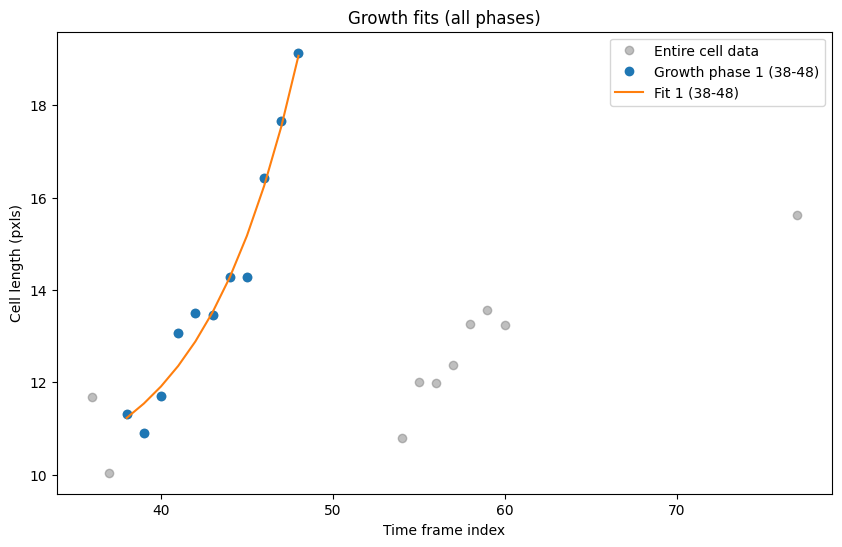

In [73]:
updated_cell_df = plot_growth_analysis(cell_df.copy(), 'time_index', 'lengths_(pxls)', prominence=0.3, distance=3, window_size=3)

In [74]:
from scipy.cluster.hierarchy import linkage, dendrogram
from sklearn.preprocessing import StandardScaler

In [206]:
def cluster_growth_traces(cell_df, cell_id_col, growth_phase_col, time_col, length_col, method='ward', metric='euclidean'):
    """Performs hierarchical clustering on cell growth traces.

    Args:
        cell_df (pd.DataFrame): DataFrame with cell IDs, time, and length data.
        time_col (str): Name of the time column.
        length_col (str): Name of the length column.
        method (str): Linkage method for hierarchical clustering (e.g., 'ward', 'average', 'complete').
        metric (str): Distance metric (e.g., 'euclidean', 'correlation').

    Returns:
        tuple: A tuple containing the linkage matrix and the figure/axes of the dendrogram.
               Returns None if there's an issue with the data.
    """

    try:
        # 1. Data Preparation: Reshape and Normalize
        # Pivot the table to have cell IDs as rows and time points as columns
        growth_matrix = cell_df.pivot(index=[cell_id_col, growth_phase_col] , columns=time_col, values=length_col)

        # Handle NaNs (important!)
        growth_matrix = growth_matrix.fillna(growth_matrix.mean()) # or other strategies


        # Normalize (important!) - crucial for meaningful distances
        scaler = StandardScaler()
        normalized_growth_matrix = scaler.fit_transform(growth_matrix)
        cell_ids = growth_matrix.index 

        # 2. Hierarchical Clustering
        linked = linkage(normalized_growth_matrix, method=method, metric=metric)

        # 3. Dendrogram Plotting
        plt.figure(figsize=(10, 7))
        dendrogram_result = dendrogram(linked, orientation='top', labels=growth_matrix.index,  # Use cell IDs as labels
                                      distance_sort='descending', show_leaf_counts=True) #Show leaf counts

        plt.title("Hierarchical Clustering Dendrogram")
        plt.xlabel("Cell ID")
        plt.ylabel("Distance")

        return linked, cell_ids, plt.gcf(), plt.gca() # Return linkage matrix and dendrogram figure

    except Exception as e:
        print(f"Error during clustering: {e}")
        return None

In [103]:
all_cells_clustered['cluster'].unique()

array([2, 1, 6, 4, 5, 3, 7], dtype=int32)

# First establish the growth periods then cluster purely on detected growth periods?

In [104]:
all_cells_pd['cell_id'].unique()

array(['f445p0005t0028r01', 'f445p0005t0028r04', 'f445p0005t0029r03',
       'f445p0005t0030r04', 'f900p0005t0028r01', 'f900p0005t0028r02',
       'f900p0005t0062r02', 'f900p0005t0072r04', 'f05p1128t0052r04',
       'f05p1128t0052r05', 'f05p1128t0058r05', 'f05p1128t0058r07',
       'f05p1128t0060r09', 'f05p1128t0074r09', 'f1128p0005t0028r01',
       'f1128p0005t0028r02', 'f1128p0005t0036r03', 'f1128p0005t0037r05',
       'f1277p0005t0028r01', 'f1277p0005t0028r02', 'f1277p0005t0028r04',
       'f1277p0005t0028r05', 'f1277p0005t0136r13', 'f05p1887t0058r08',
       'f05p1887t0058r10', 'f05p1887t0060r10', 'f05p1887t0060r11',
       'f05p1887t0063r11', 'f05p1887t0063r12', 'f05p1887t0076r11',
       'f05p1887t0080r11', 'f05p1887t0080r13', 'f05p1887t0095r16',
       'f05p1887t0102r16', 'f1887p0005t0028r02', 'f1887p0005t0028r03',
       'f1887p0005t0030r04', 'f1887p0005t0031r05', 'f05p2115t0035r02',
       'f05p2115t0035r03', 'f05p2115t0048r09', 'f05p2115t0070r10',
       'f2115p0005t0028r03',

No growth phases detected.


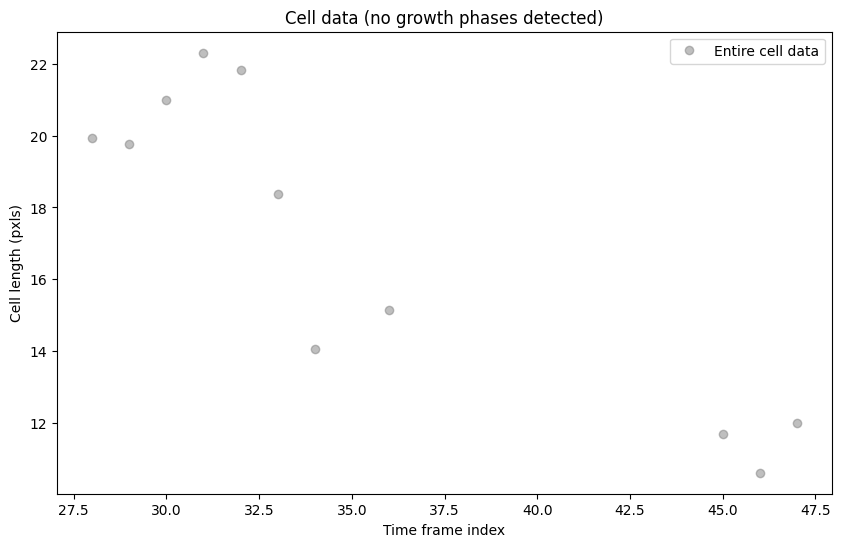

Fitting growth phase 1 from 36 to 40
  Fit parameters: A=0.00, k=2.1041, b=18.01
  R-squared: 0.9750
Fitting growth phase 2 from 61 to 74
  Fit parameters: A=0.61, k=0.0553, b=-4.16
  R-squared: 0.9569


/var/folders/hj/bk95lprn3zb88y7bqhjh9j5m0000gr/T/ipykernel_6882/3010087961.py:4: RuntimeWarning: overflow encountered in exp
  return a * np.exp(b*x) + c


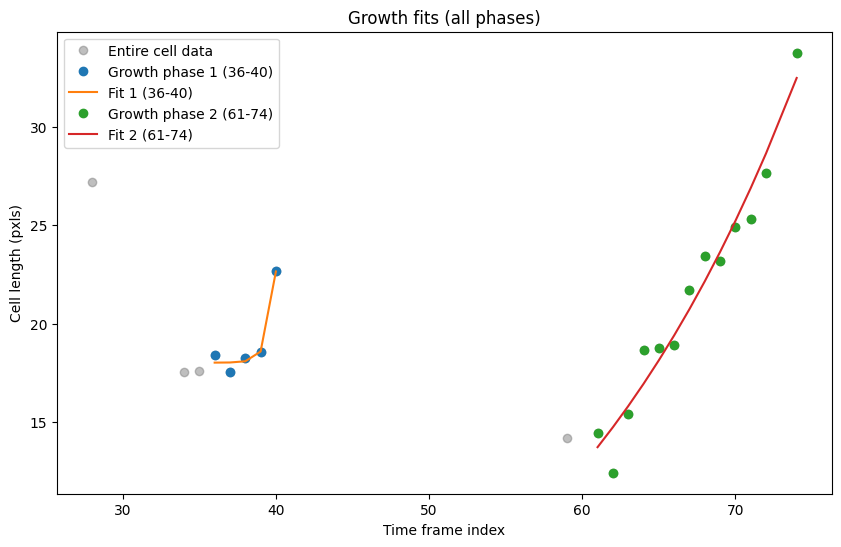

Fitting growth phase 1 from 32 to 36
Error during curve fitting: Optimal parameters not found: Number of calls to function has reached maxfev = 5000.
  Fit failed for phase 1 (32-36)


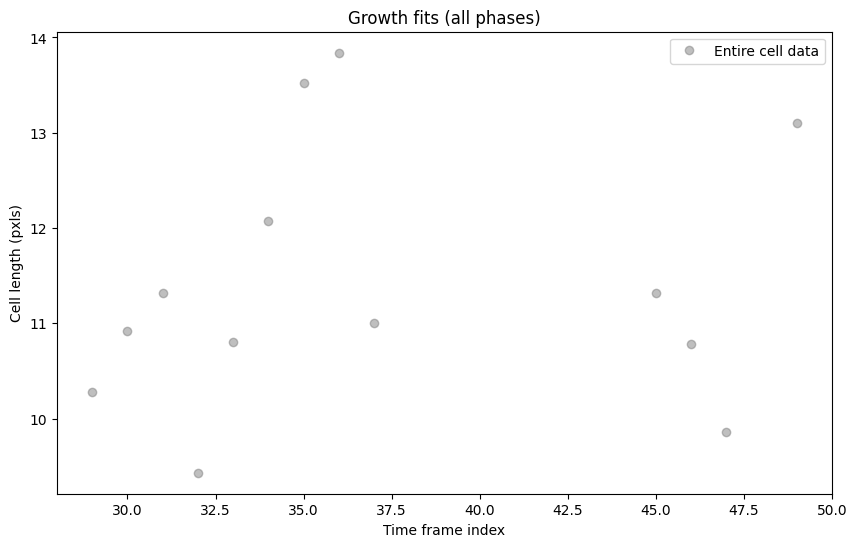

Fitting growth phase 1 from 44 to 75
  Fit parameters: A=9761.09, k=0.0000, b=-9755.89
  R-squared: 0.5122


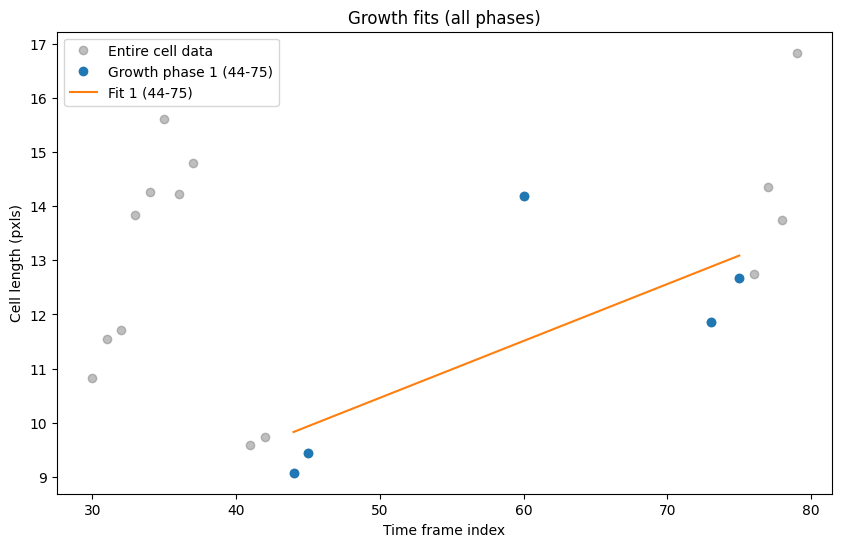

Fitting growth phase 1 from 31 to 39
  Fit parameters: A=2.39, k=0.0696, b=-9.94
  R-squared: 0.9141


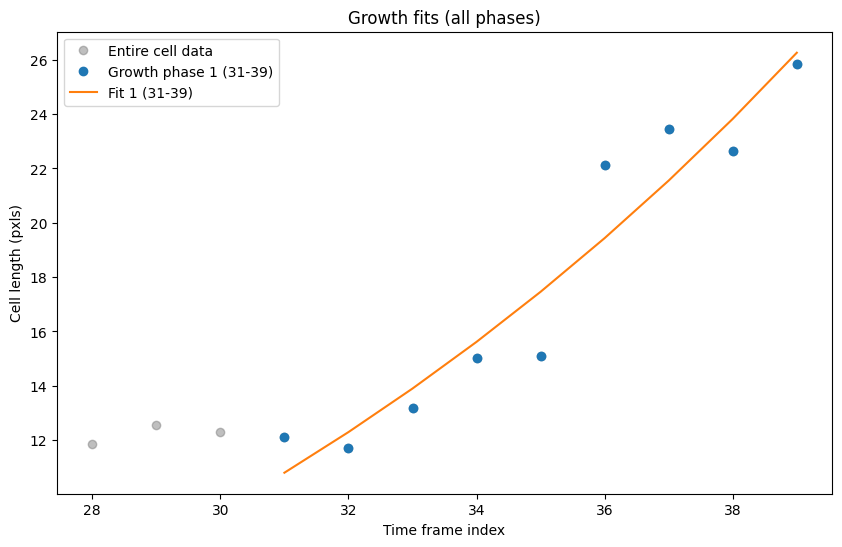

Fitting growth phase 1 from 29 to 40
  Fit parameters: A=68.44, k=0.0063, b=-71.86
  R-squared: 0.8820
Fitting growth phase 2 from 40 to 52
  Fit parameters: A=15627.65, k=0.0000, b=-15637.27
  R-squared: 0.8487
Fitting growth phase 3 from 66 to 83
  Fit parameters: A=29824.50, k=0.0000, b=-29840.78
  R-squared: 0.3540


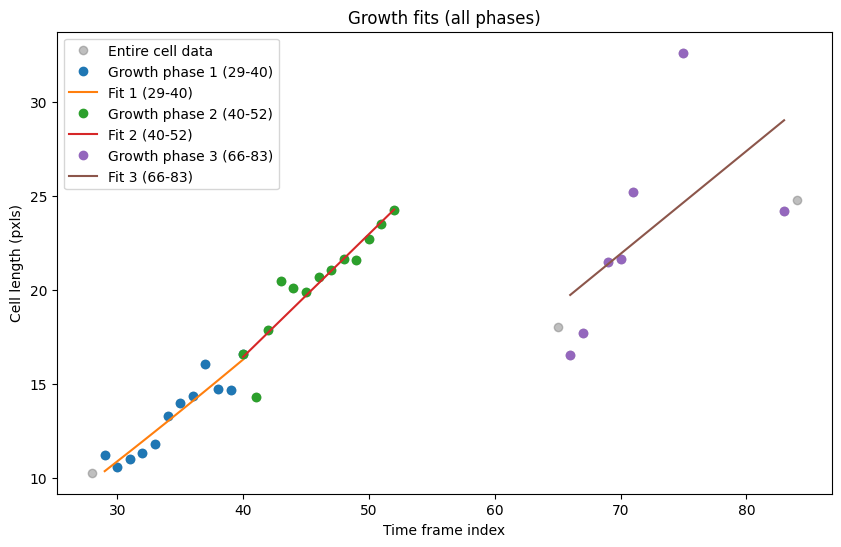

Fitting growth phase 1 from 63 to 72
  Fit parameters: A=3.96, k=0.0318, b=-12.42
  R-squared: 0.9343


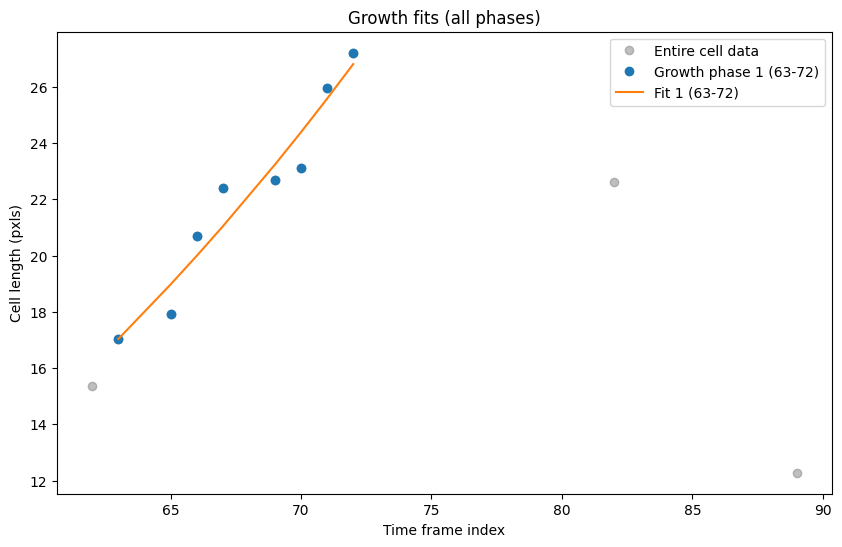

No growth phases detected.


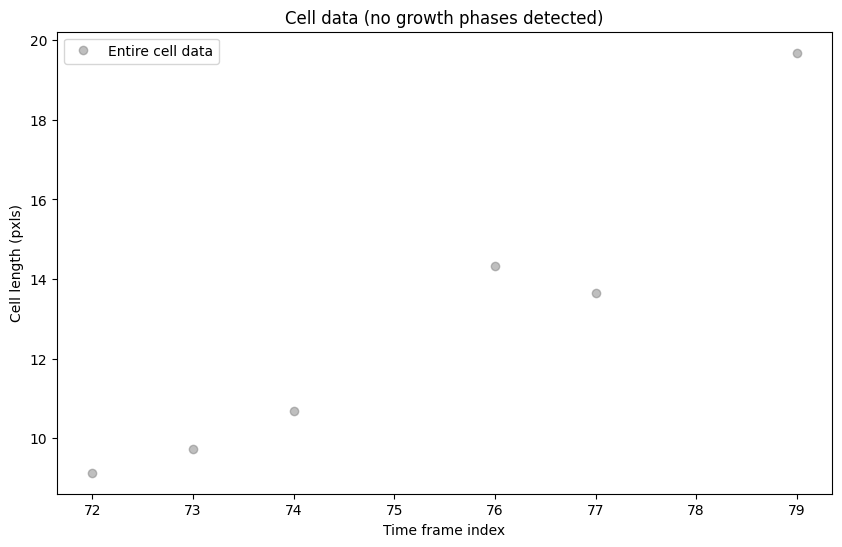

Fitting growth phase 1 from 53 to 59
  Fit parameters: A=0.02, k=0.1147, b=5.30
  R-squared: 0.9899
Fitting growth phase 2 from 69 to 71
Error during curve fitting: Optimal parameters not found: Number of calls to function has reached maxfev = 5000.
  Fit failed for phase 2 (69-71)


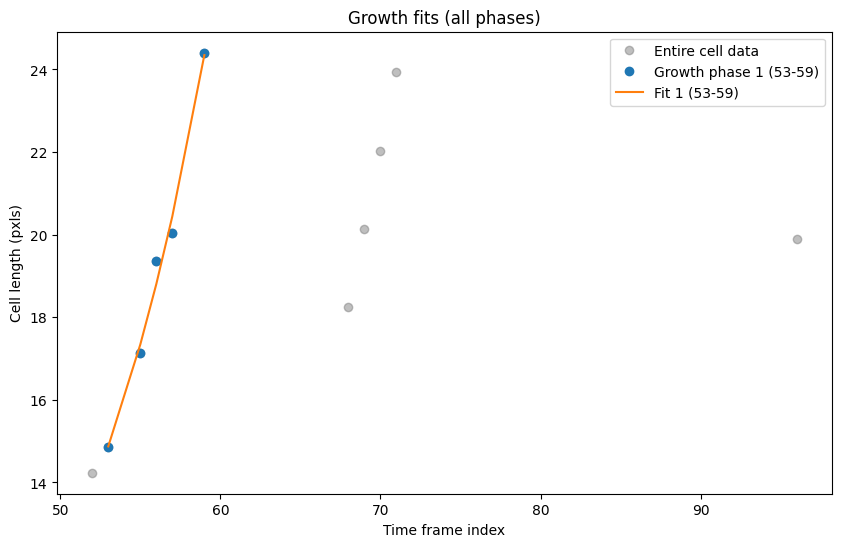

Fitting growth phase 1 from 53 to 59
  Fit parameters: A=0.00, k=1.0397, b=12.53
  R-squared: 0.9631


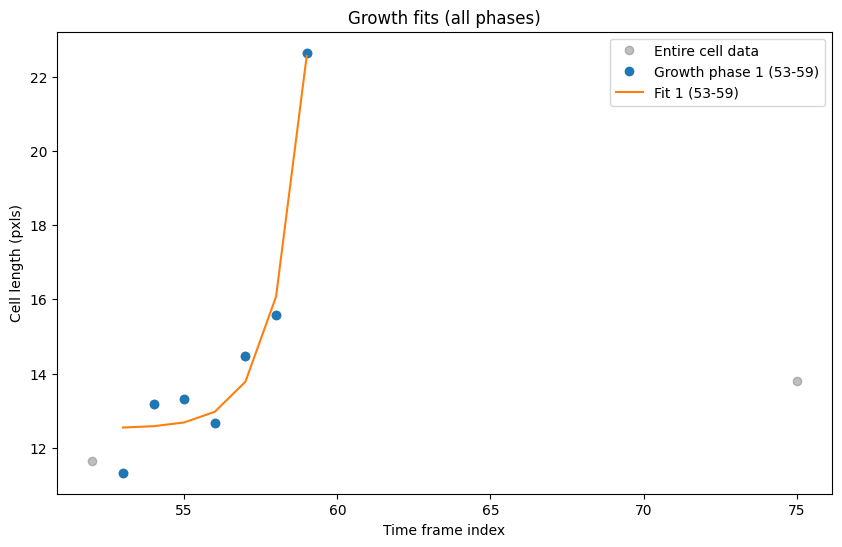

Fitting growth phase 1 from 65 to 83
  Fit parameters: A=12758.81, k=0.0000, b=-12758.85
  R-squared: 0.3139


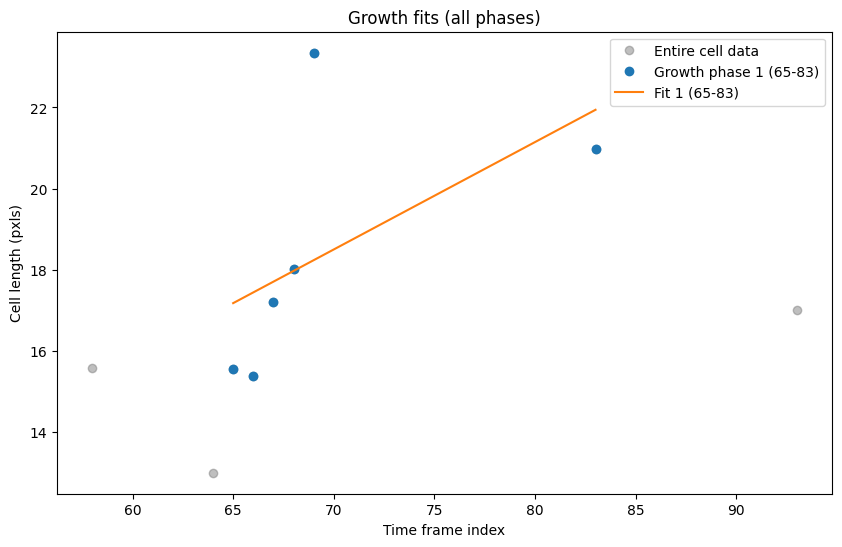

No growth phases detected.


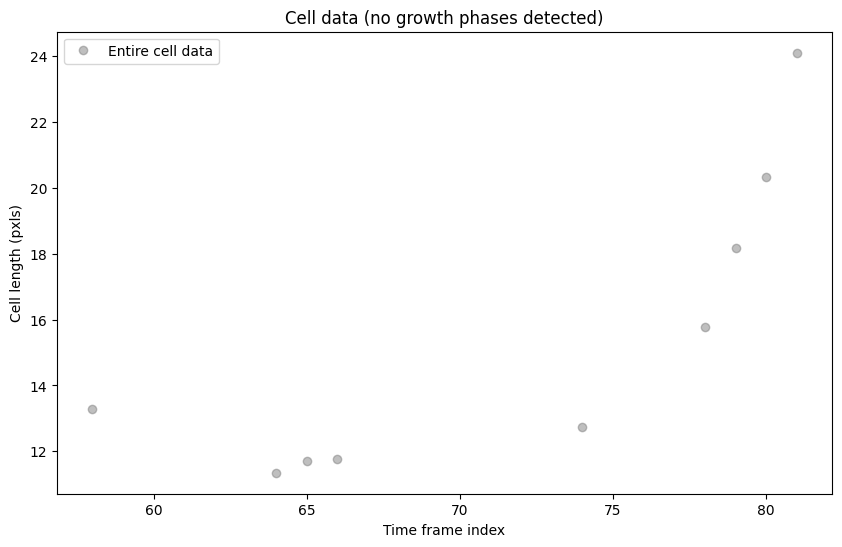

Fitting growth phase 1 from 61 to 82
  Fit parameters: A=17038.78, k=0.0000, b=-17044.03
  R-squared: 0.7338


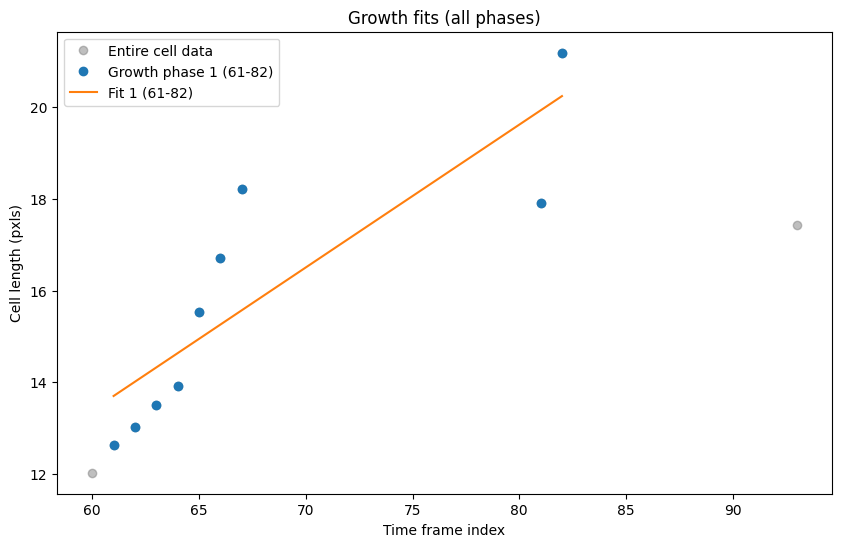

No growth phases detected.


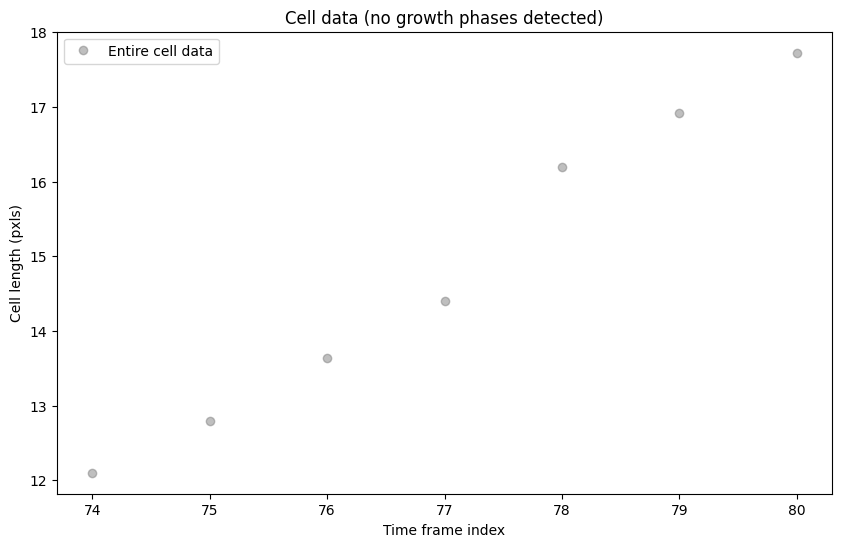

Fitting growth phase 1 from 38 to 50
  Fit parameters: A=4.24, k=0.0385, b=-7.92
  R-squared: 0.9608


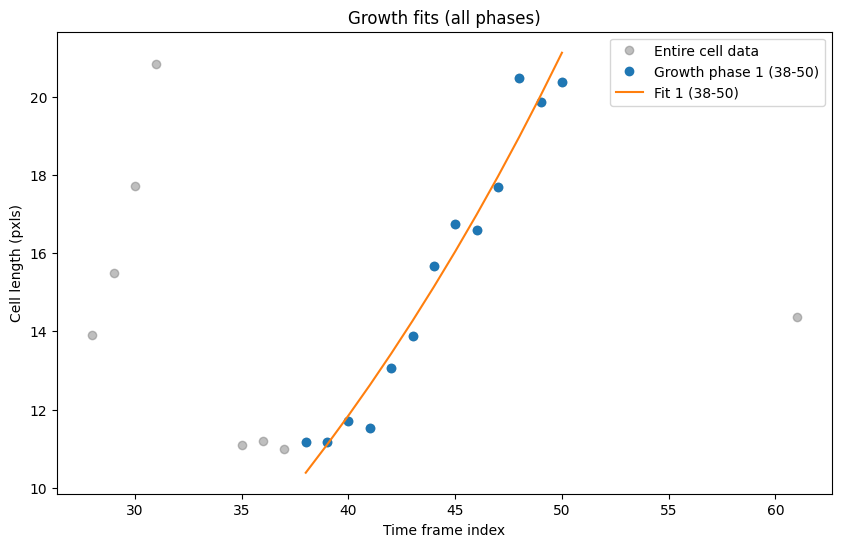

Fitting growth phase 1 from 29 to 43
  Fit parameters: A=0.24, k=-1.6875, b=17.68
  R-squared: 0.0000
Skipping phase 1 (29-43) due to poor fit (R-squared = 0.0000 < 0.3).
Fitting growth phase 2 from 44 to 98
  Fit parameters: A=9623.08, k=0.0000, b=-9605.18
  R-squared: 0.2256
Skipping phase 2 (44-98) due to poor fit (R-squared = 0.2256 < 0.3).


/Users/noravivancogonzalez/.pyenv/versions/3.9.6/envs/napari-env/lib/python3.9/site-packages/scipy/optimize/_minpack_py.py:881: OptimizeWarning: Covariance of the parameters could not be estimated
  warnings.warn('Covariance of the parameters could not be estimated',


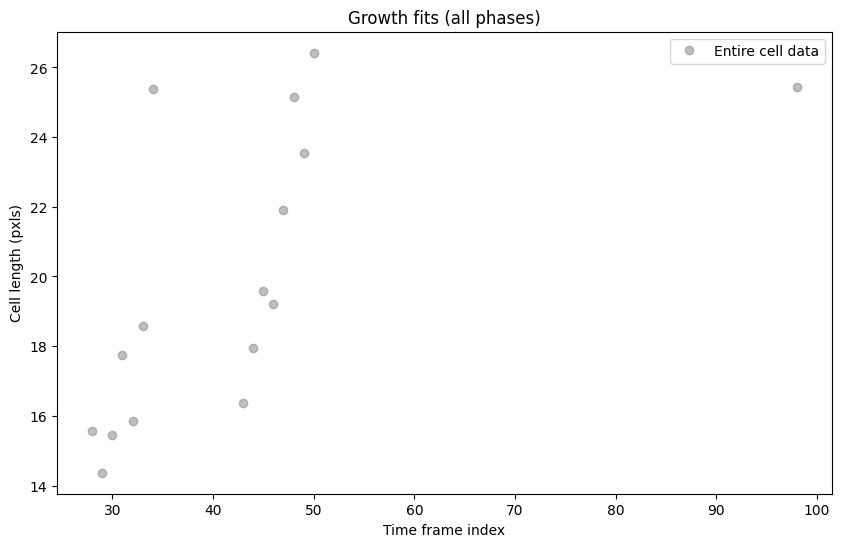

Fitting growth phase 1 from 38 to 48
  Fit parameters: A=0.00, k=0.1774, b=9.62
  R-squared: 0.9683


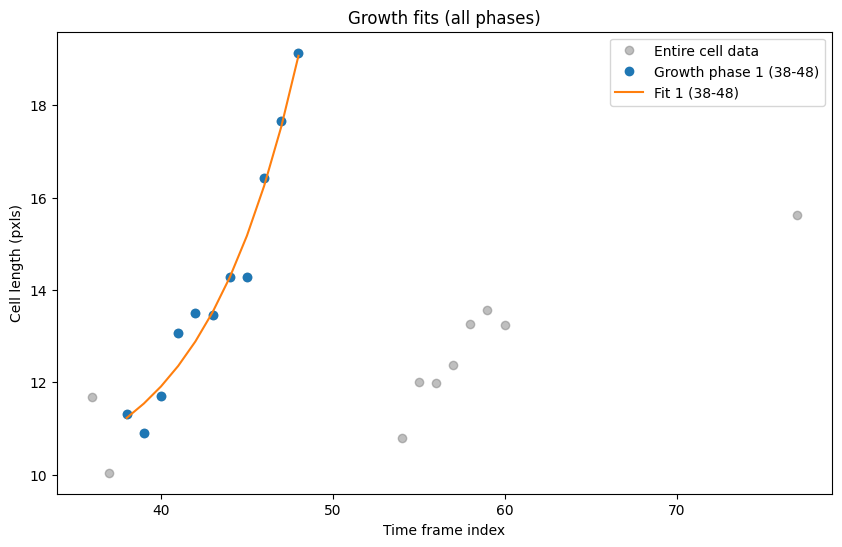

Fitting growth phase 1 from 38 to 43
  Fit parameters: A=0.00, k=0.3770, b=13.34
  R-squared: 0.9428
Fitting growth phase 2 from 59 to 94
  Fit parameters: A=19007.99, k=0.0000, b=-19003.30
  R-squared: 0.2868
Skipping phase 2 (59-94) due to poor fit (R-squared = 0.2868 < 0.3).


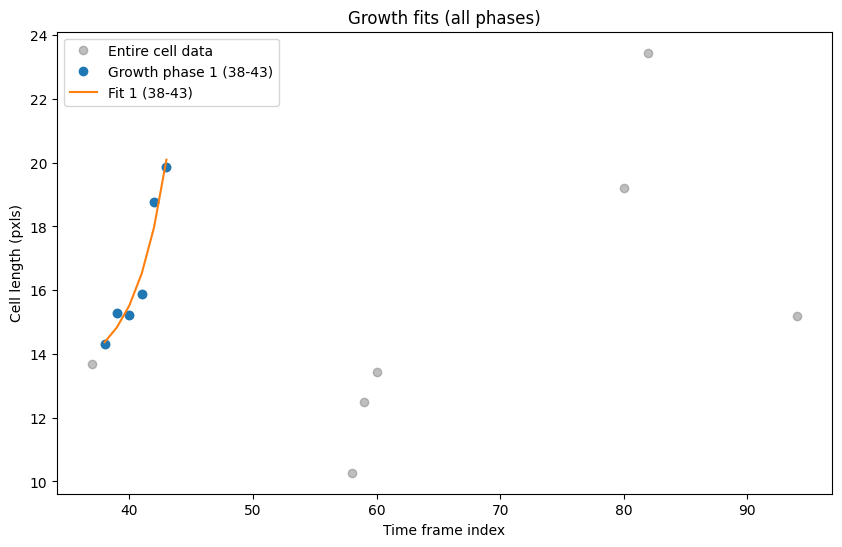

Fitting growth phase 1 from 31 to 36
  Fit parameters: A=0.00, k=0.2958, b=9.27
  R-squared: 0.9939


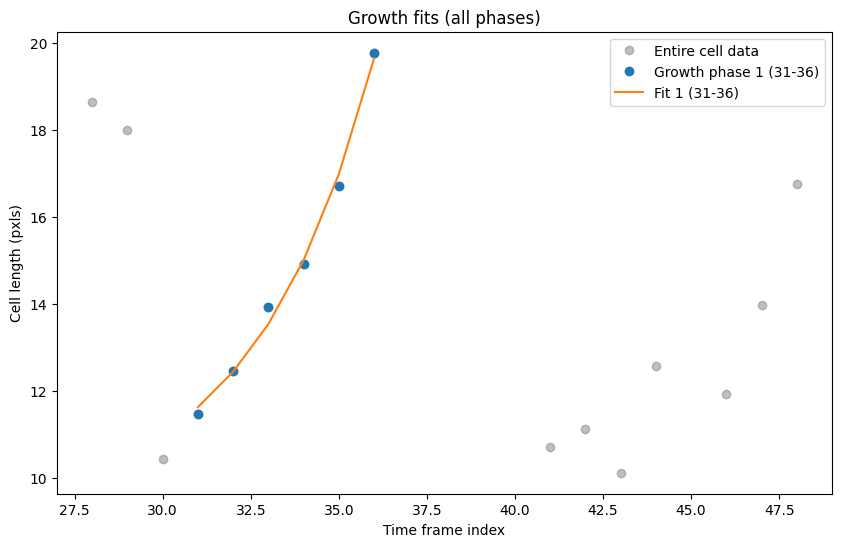

Fitting growth phase 1 from 37 to 45
  Fit parameters: A=0.03, k=0.1378, b=4.55
  R-squared: 0.9390


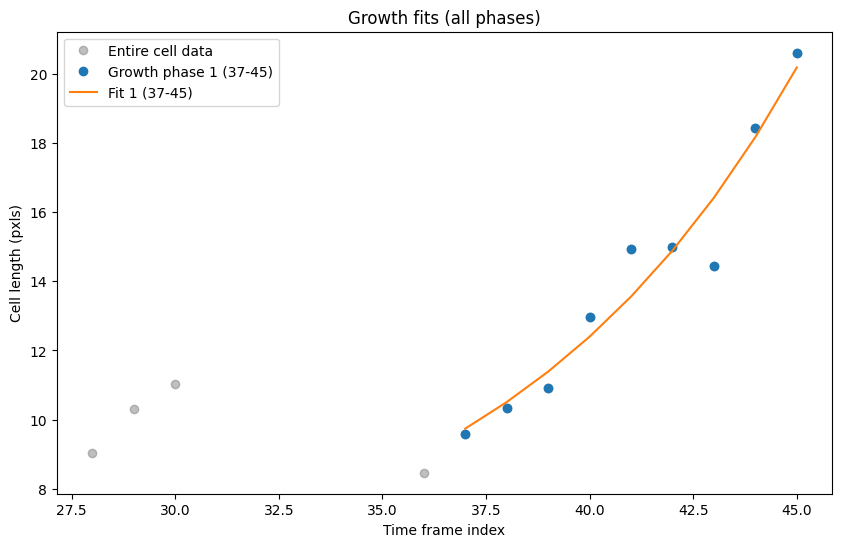

Fitting growth phase 1 from 31 to 36
  Fit parameters: A=1.68, k=0.0758, b=-6.01
  R-squared: 0.9498
Fitting growth phase 2 from 42 to 46
  Fit parameters: A=8.72, k=0.0331, b=-24.65
  R-squared: 0.8553
Fitting growth phase 3 from 66 to 84
  Fit parameters: A=22.24, k=-0.0001, b=-8.72
  R-squared: 0.0000
Skipping phase 3 (66-84) due to poor fit (R-squared = 0.0000 < 0.3).
Fitting growth phase 4 from 88 to 92
Error during curve fitting: Optimal parameters not found: Number of calls to function has reached maxfev = 5000.
  Fit failed for phase 4 (88-92)
Fitting growth phase 5 from 97 to 125
  Fit parameters: A=9826.85, k=0.0000, b=-9826.78
  R-squared: 0.1138
Skipping phase 5 (97-125) due to poor fit (R-squared = 0.1138 < 0.3).
Fitting growth phase 6 from 127 to 129
Error during curve fitting: Optimal parameters not found: Number of calls to function has reached maxfev = 5000.
  Fit failed for phase 6 (127-129)
Fitting growth phase 7 from 134 to 137
Error during curve fitting: Optimal pa

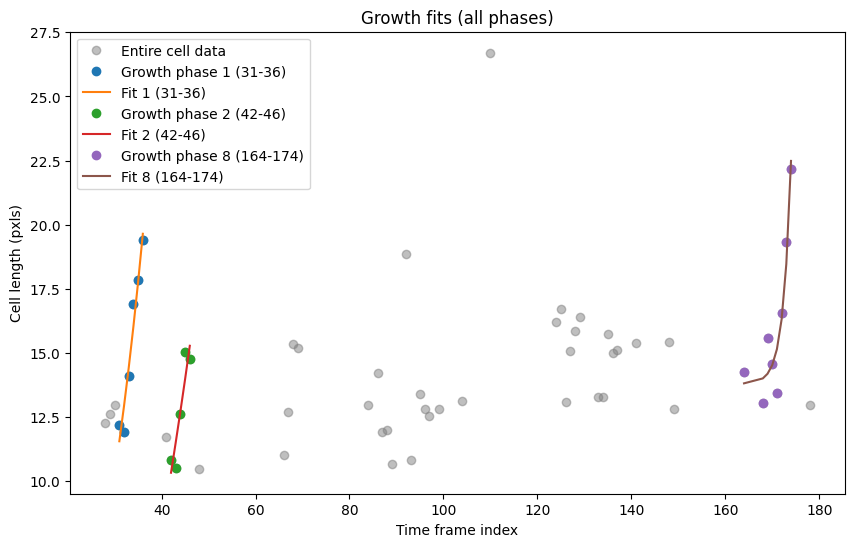

Fitting growth phase 1 from 29 to 44
  Fit parameters: A=17016.84, k=0.0000, b=-17015.59
  R-squared: 0.3830
Fitting growth phase 2 from 44 to 48
  Fit parameters: A=0.01, k=0.1529, b=6.18
  R-squared: 0.8936
Fitting growth phase 3 from 65 to 70
  Fit parameters: A=0.00, k=0.4176, b=10.22
  R-squared: 0.9715
Fitting growth phase 4 from 78 to 87
Error during curve fitting: Optimal parameters not found: Number of calls to function has reached maxfev = 5000.
  Fit failed for phase 4 (78-87)
Fitting growth phase 5 from 93 to 112
  Fit parameters: A=7320.99, k=0.0000, b=-7317.35
  R-squared: 0.3075
Fitting growth phase 6 from 112 to 116
  Fit parameters: A=0.01, k=0.0684, b=-0.01
  R-squared: 0.7583
Fitting growth phase 7 from 127 to 136
  Fit parameters: A=7928.30, k=0.0000, b=-7959.76
  R-squared: 0.1538
Skipping phase 7 (127-136) due to poor fit (R-squared = 0.1538 < 0.3).
Fitting growth phase 8 from 137 to 147
  Fit parameters: A=7462.39, k=0.0000, b=-7499.28
  R-squared: 0.2882
Skippin

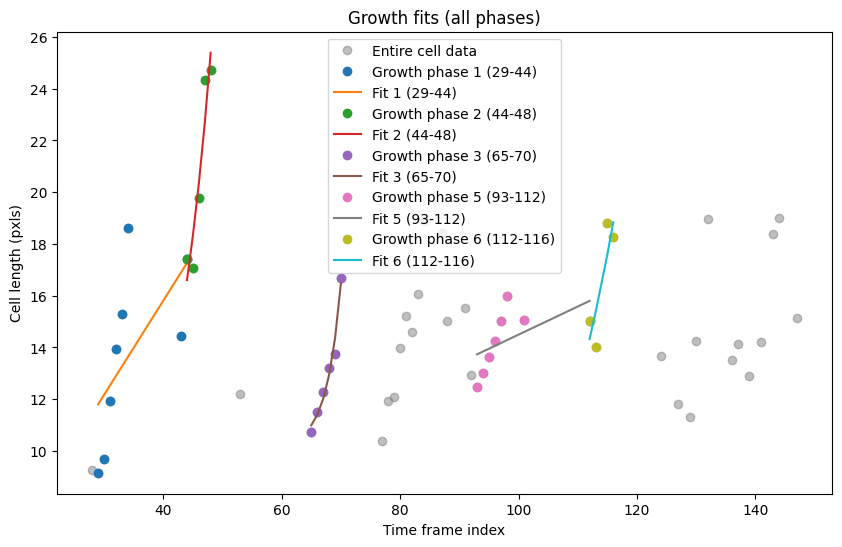

No growth phases detected.


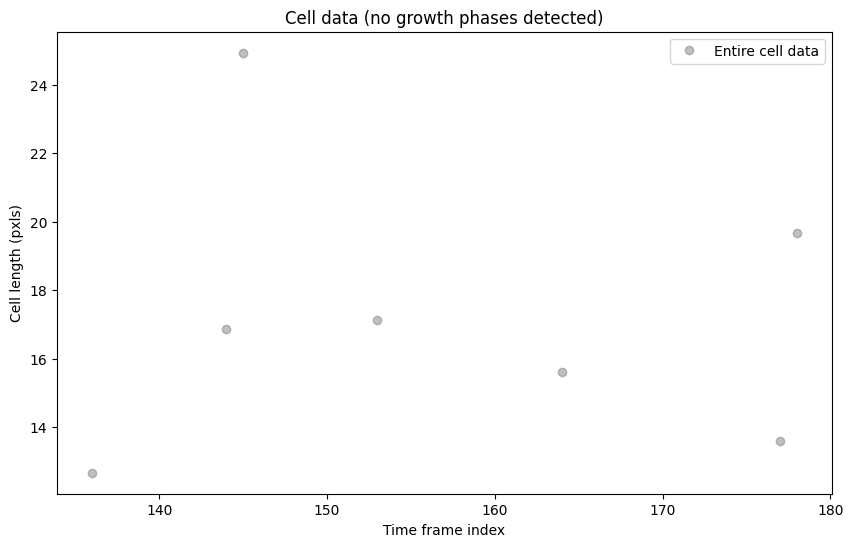

No growth phases detected.


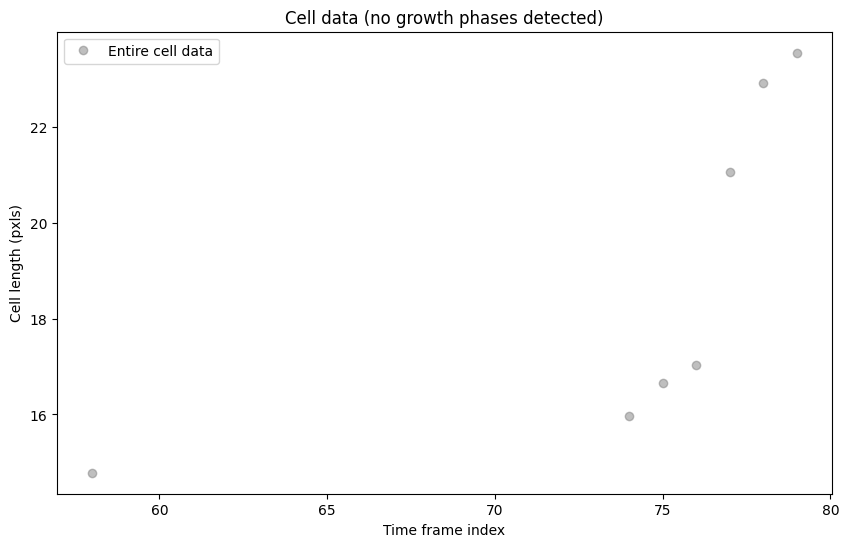

No growth phases detected.


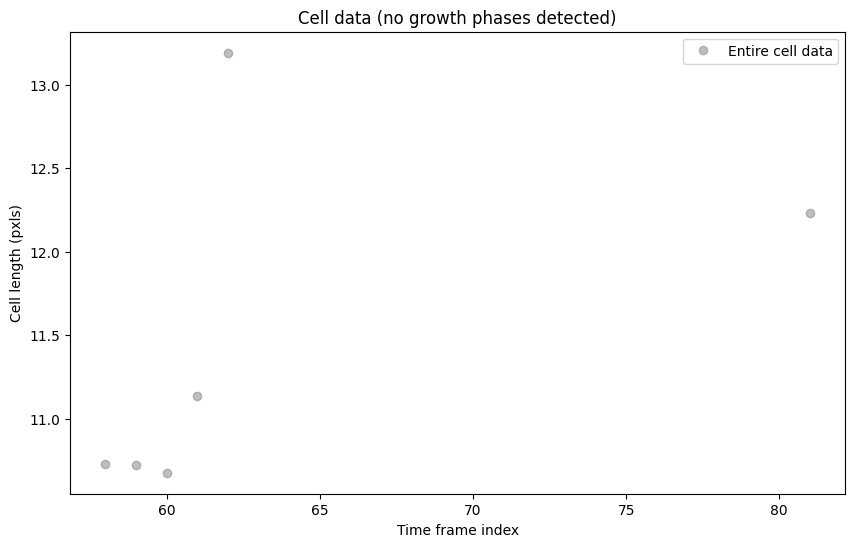

Fitting growth phase 1 from 69 to 148
  Fit parameters: A=6774.86, k=0.0000, b=-6769.54
  R-squared: 0.6370


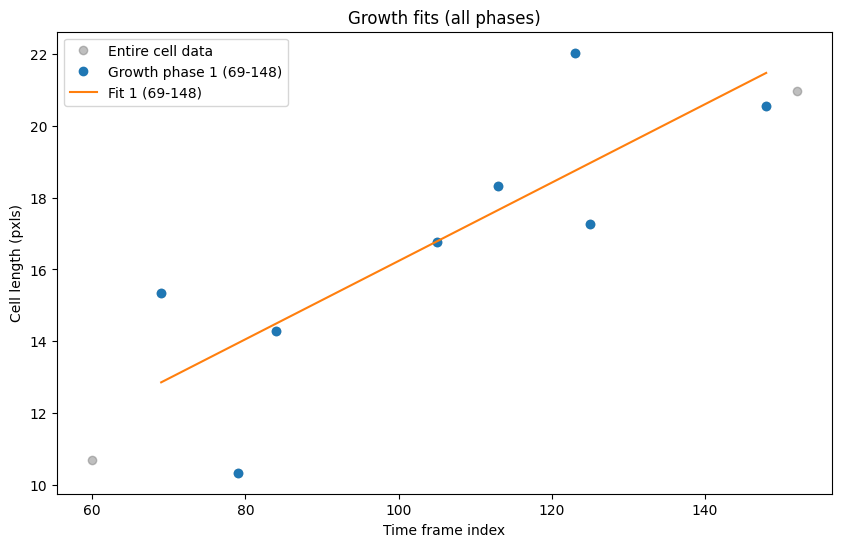

No growth phases detected.


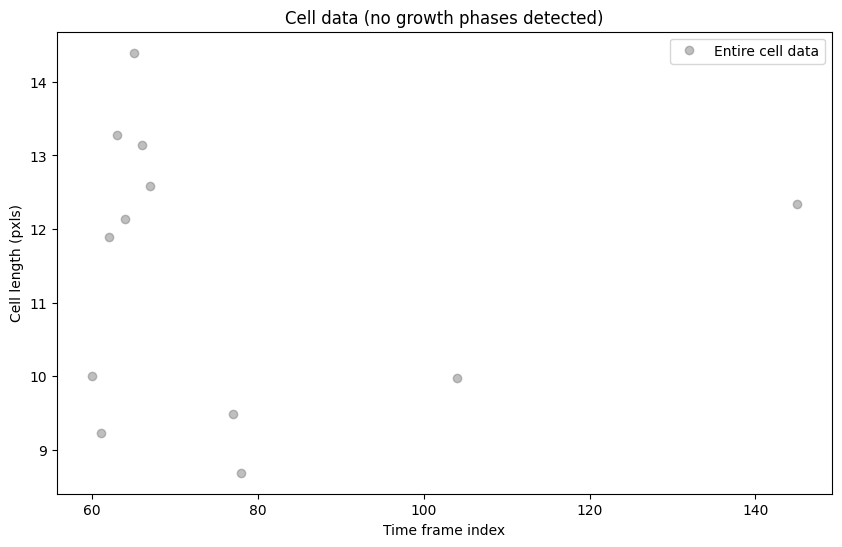

Fitting growth phase 1 from 68 to 168
  Fit parameters: A=4577.01, k=0.0000, b=-4561.80
  R-squared: 0.0351
Skipping phase 1 (68-168) due to poor fit (R-squared = 0.0351 < 0.3).


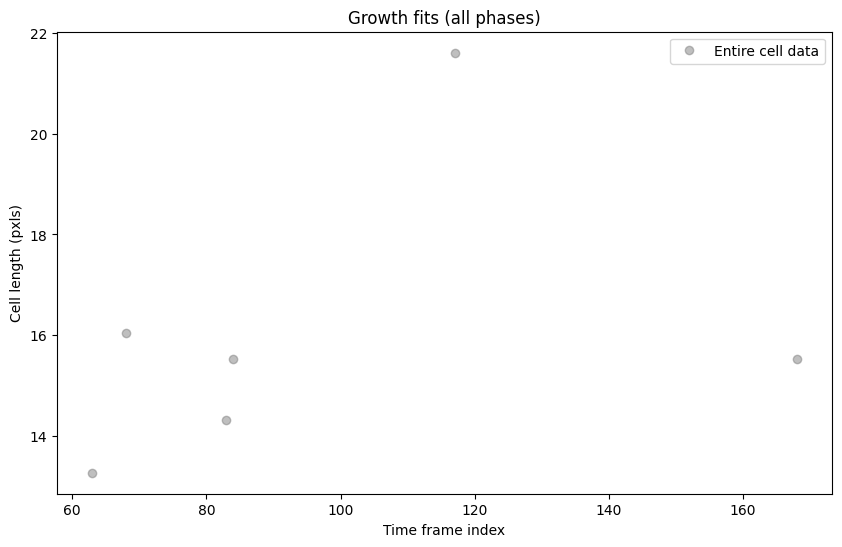

Fitting growth phase 1 from 153 to 156
Error during curve fitting: Optimal parameters not found: Number of calls to function has reached maxfev = 5000.
  Fit failed for phase 1 (153-156)


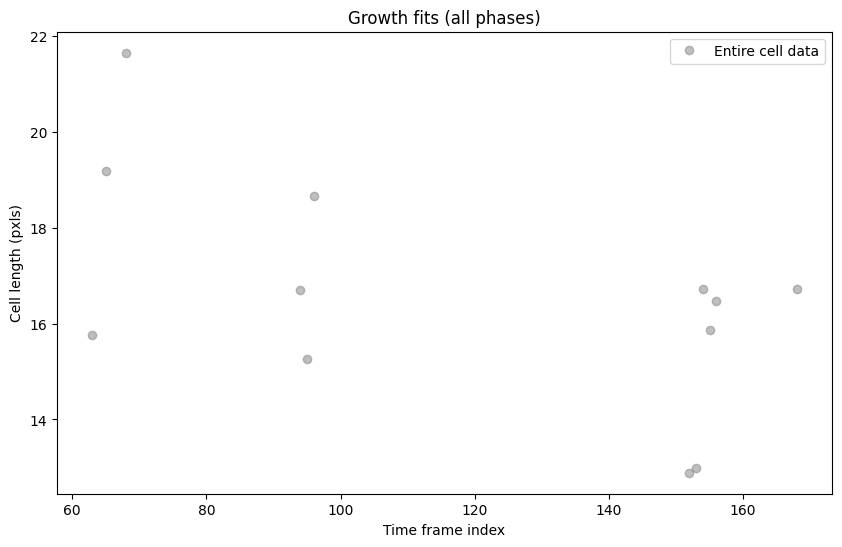

No growth phases detected.


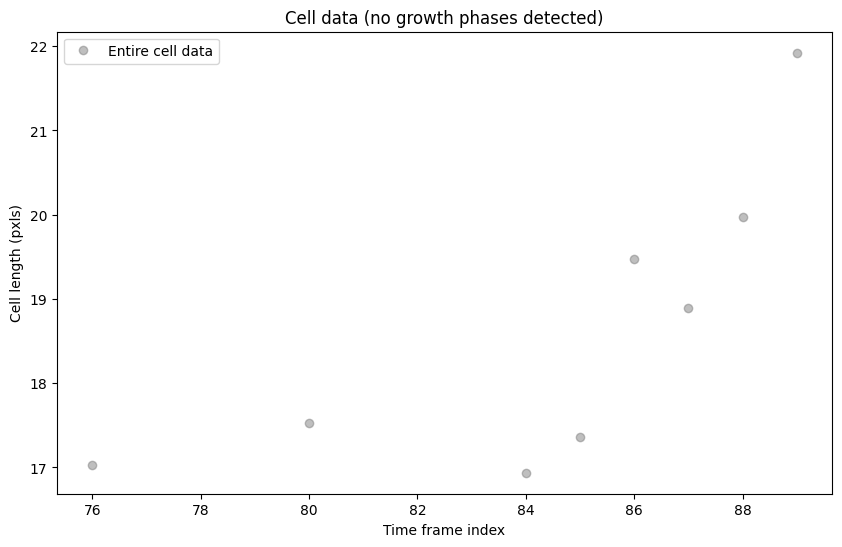

Fitting growth phase 1 from 98 to 141
  Fit parameters: A=3177.09, k=0.0000, b=-3171.52
  R-squared: 0.1221
Skipping phase 1 (98-141) due to poor fit (R-squared = 0.1221 < 0.3).
Fitting growth phase 2 from 141 to 147
Error during curve fitting: Optimal parameters not found: Number of calls to function has reached maxfev = 5000.
  Fit failed for phase 2 (141-147)
Fitting growth phase 3 from 151 to 171
Error during curve fitting: Optimal parameters not found: Number of calls to function has reached maxfev = 5000.
  Fit failed for phase 3 (151-171)
Fitting growth phase 4 from 171 to 173
Error during curve fitting: Optimal parameters not found: Number of calls to function has reached maxfev = 5000.
  Fit failed for phase 4 (171-173)
Fitting growth phase 5 from 173 to 178
  Fit parameters: A=0.00, k=0.2695, b=12.13
  R-squared: 0.7076


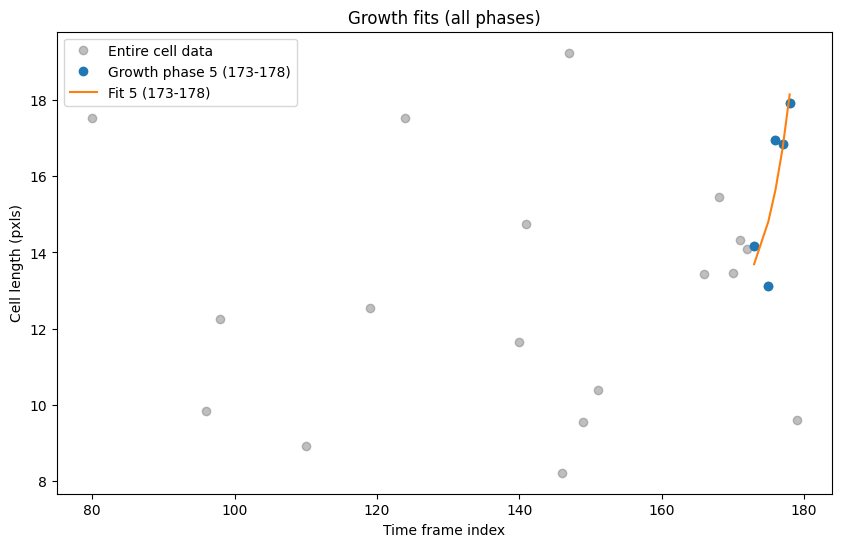

No growth phases detected.


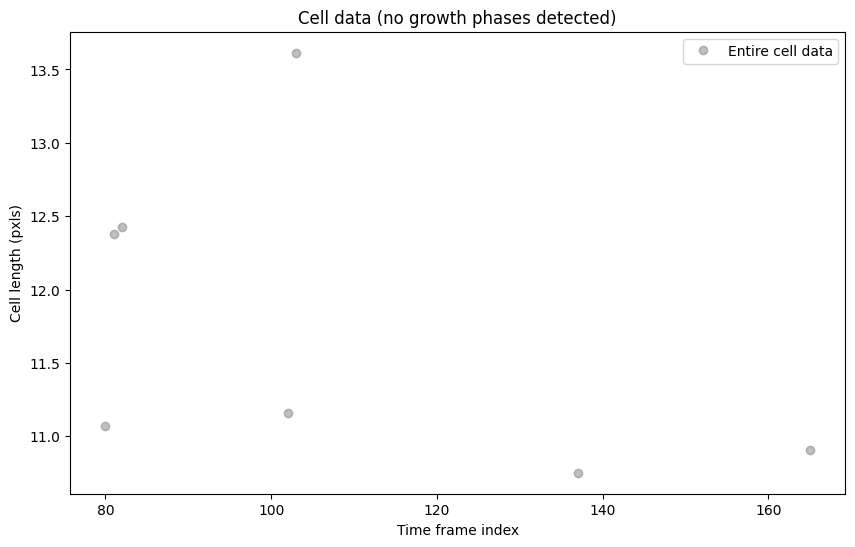

Fitting growth phase 1 from 98 to 113
  Fit parameters: A=1972.64, k=0.0001, b=-1974.84
  R-squared: 0.7350
Fitting growth phase 2 from 173 to 173
Skipping phase 2 (173-173) due to insufficient data points.


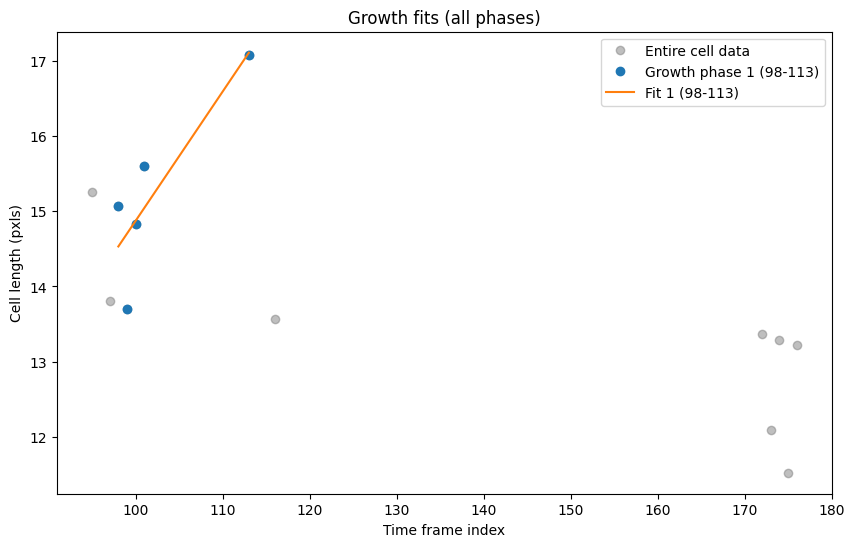

No growth phases detected.


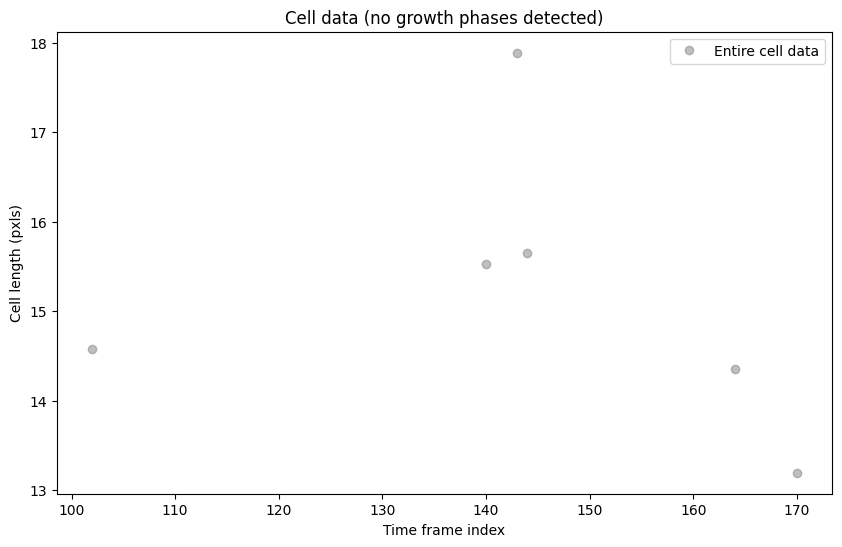

Fitting growth phase 1 from 40 to 53
Error during curve fitting: Optimal parameters not found: Number of calls to function has reached maxfev = 5000.
  Fit failed for phase 1 (40-53)


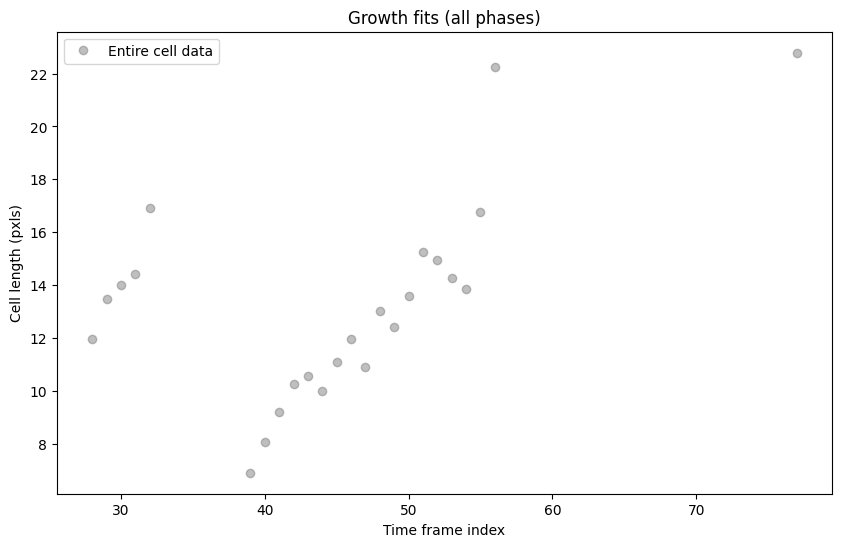

Fitting growth phase 1 from 40 to 45
  Fit parameters: A=8640.58, k=0.0001, b=-8652.00
  R-squared: 0.6913
Fitting growth phase 2 from 46 to 55
  Fit parameters: A=11963.95, k=0.0000, b=-11974.17
  R-squared: 0.7196
Fitting growth phase 3 from 57 to 61
Error during curve fitting: Optimal parameters not found: Number of calls to function has reached maxfev = 5000.
  Fit failed for phase 3 (57-61)
Fitting growth phase 4 from 63 to 66
Error during curve fitting: Optimal parameters not found: Number of calls to function has reached maxfev = 5000.
  Fit failed for phase 4 (63-66)


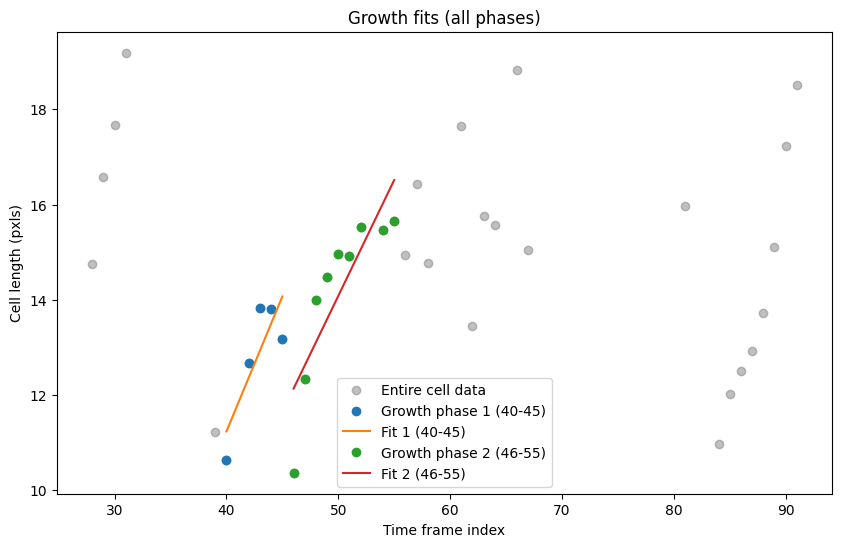

Fitting growth phase 1 from 37 to 85
  Fit parameters: A=19061.06, k=0.0000, b=-19054.32
  R-squared: 0.2437
Skipping phase 1 (37-85) due to poor fit (R-squared = 0.2437 < 0.3).
Fitting growth phase 2 from 85 to 170
  Fit parameters: A=2.08, k=0.0095, b=10.00
  R-squared: 0.2450
Skipping phase 2 (85-170) due to poor fit (R-squared = 0.2450 < 0.3).


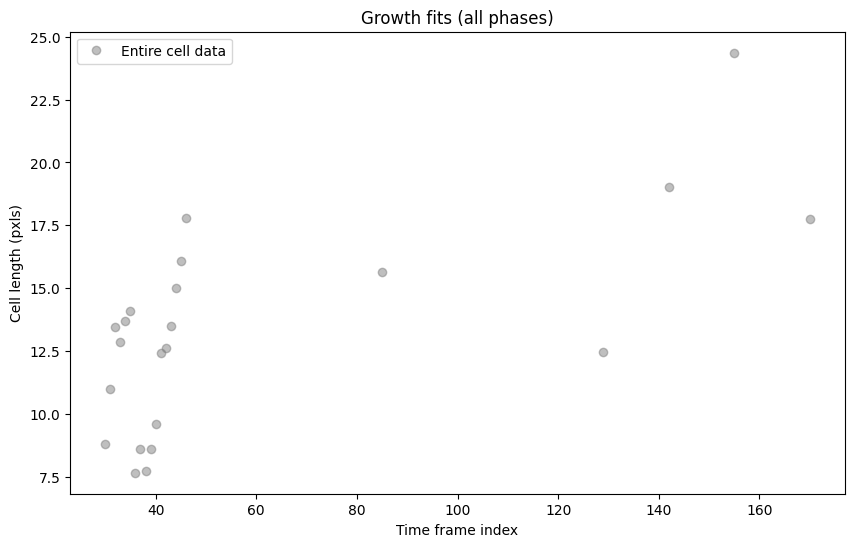

Fitting growth phase 1 from 52 to 140
  Fit parameters: A=0.00, k=0.1014, b=19.15
  R-squared: 0.7358


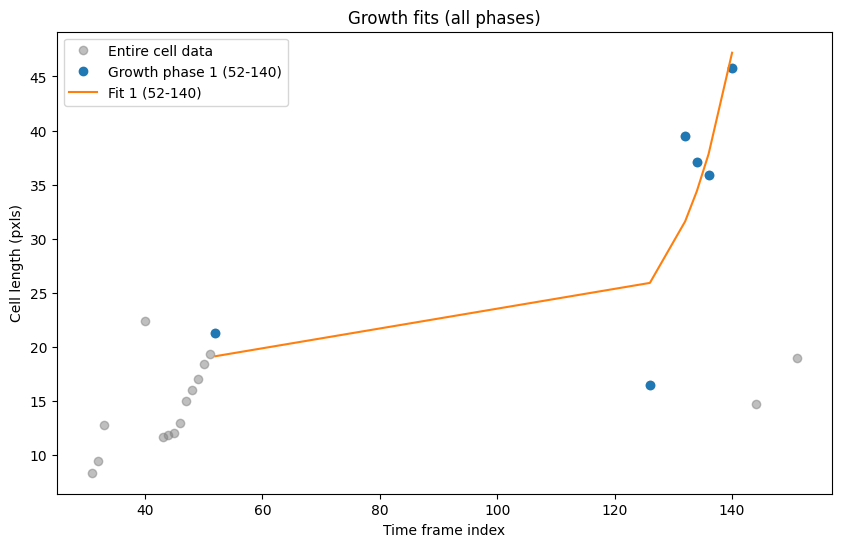

Fitting growth phase 1 from 38 to 43
  Fit parameters: A=4.42, k=0.0441, b=-13.04
  R-squared: 0.7520


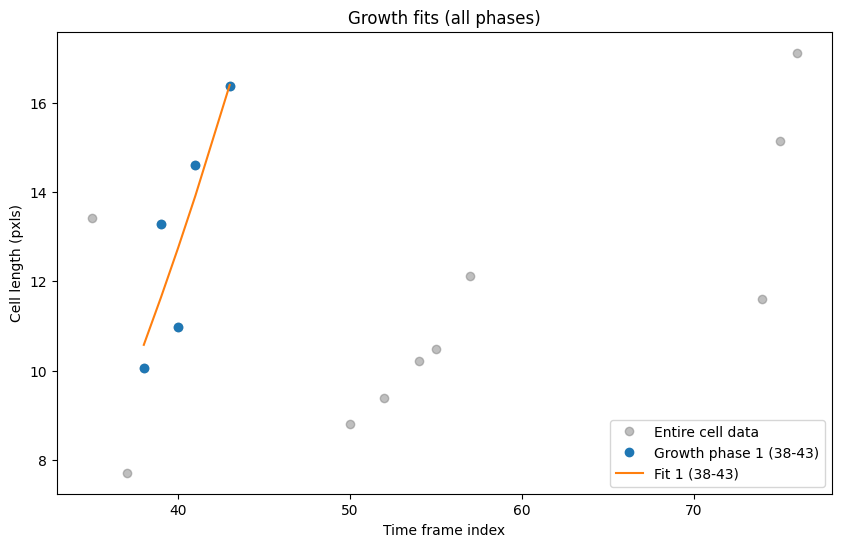

Fitting growth phase 1 from 37 to 47
  Fit parameters: A=4165.53, k=0.0001, b=-4172.65
  R-squared: 0.6912
Fitting growth phase 2 from 50 to 63
Error during curve fitting: Optimal parameters not found: Number of calls to function has reached maxfev = 5000.
  Fit failed for phase 2 (50-63)


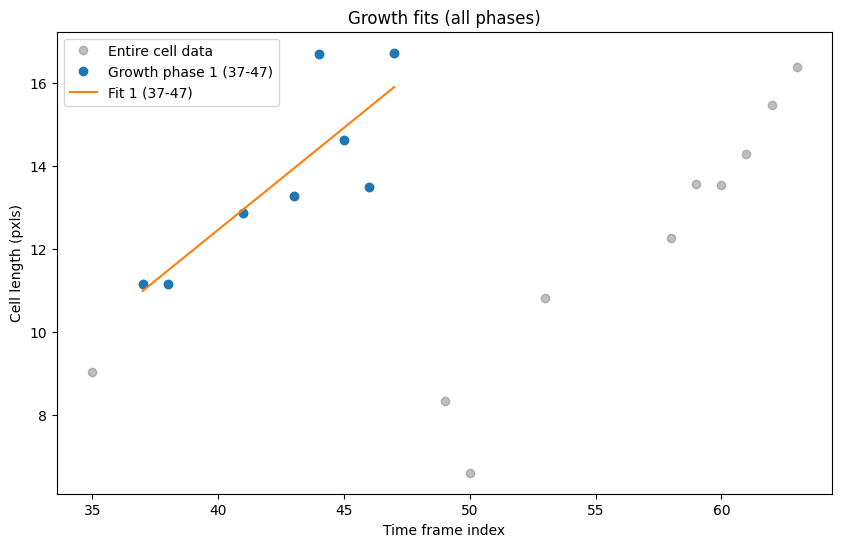

Fitting growth phase 1 from 52 to 78
  Fit parameters: A=0.00, k=0.1289, b=8.70
  R-squared: 0.9644


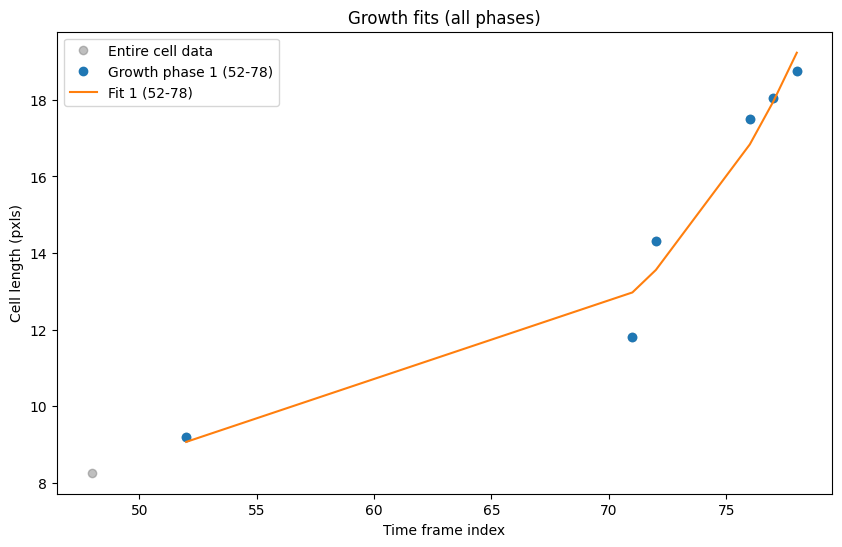

No growth phases detected.


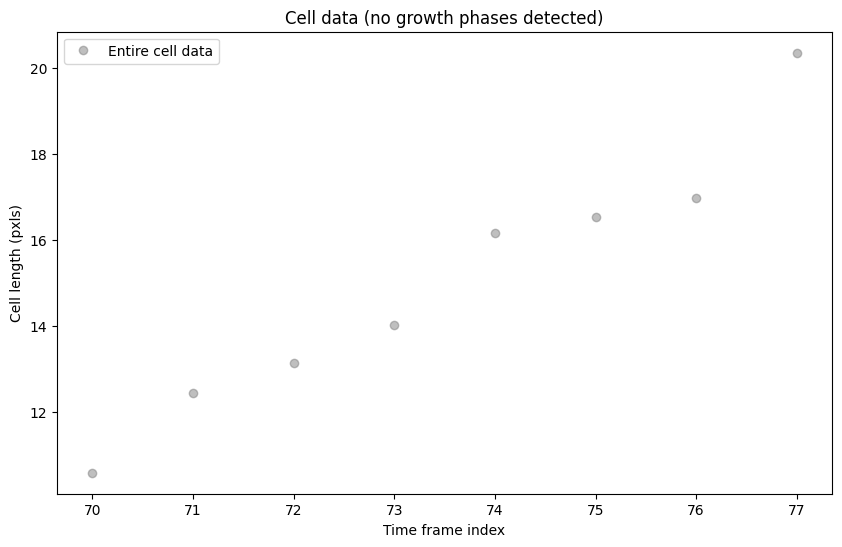

Fitting growth phase 1 from 35 to 64
  Fit parameters: A=16807.79, k=0.0000, b=-16797.37
  R-squared: 0.3691
Fitting growth phase 2 from 64 to 66
Error during curve fitting: Optimal parameters not found: Number of calls to function has reached maxfev = 5000.
  Fit failed for phase 2 (64-66)


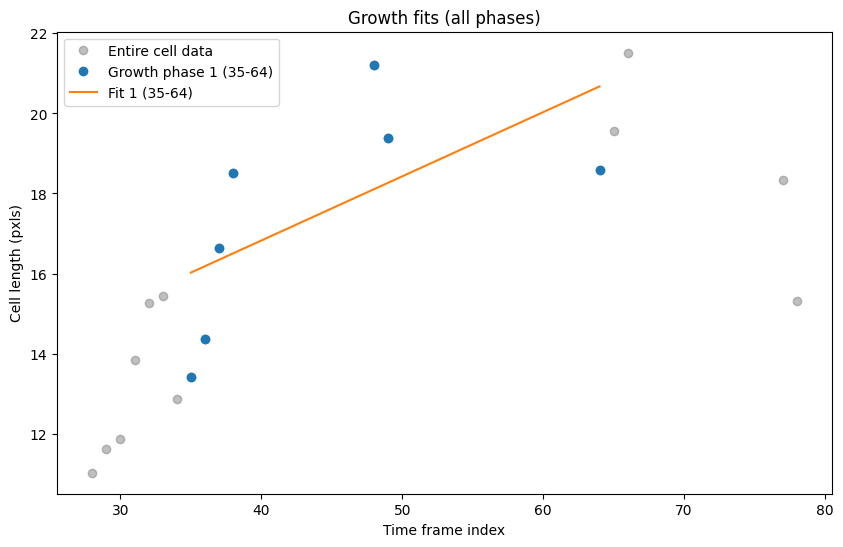

Fitting growth phase 1 from 36 to 137
  Fit parameters: A=12.64, k=0.0143, b=-11.04
  R-squared: 0.9797


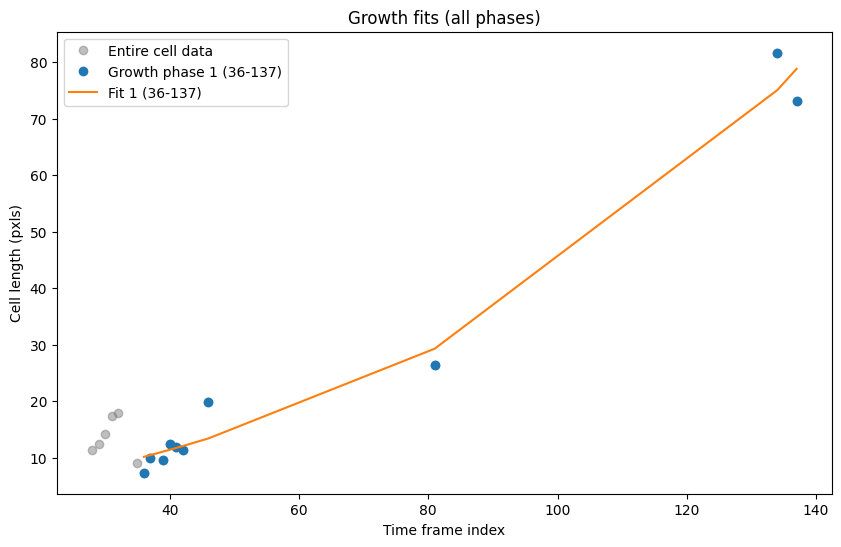

Fitting growth phase 1 from 41 to 45
  Fit parameters: A=0.00, k=0.4380, b=10.08
  R-squared: 0.8274
Fitting growth phase 2 from 59 to 61
  Fit parameters: A=0.00, k=0.6611, b=14.28
  R-squared: 1.0000


/var/folders/hj/bk95lprn3zb88y7bqhjh9j5m0000gr/T/ipykernel_6882/3010087961.py:4: RuntimeWarning: overflow encountered in exp
  return a * np.exp(b*x) + c
/Users/noravivancogonzalez/.pyenv/versions/3.9.6/envs/napari-env/lib/python3.9/site-packages/scipy/optimize/_minpack_py.py:881: OptimizeWarning: Covariance of the parameters could not be estimated
  warnings.warn('Covariance of the parameters could not be estimated',


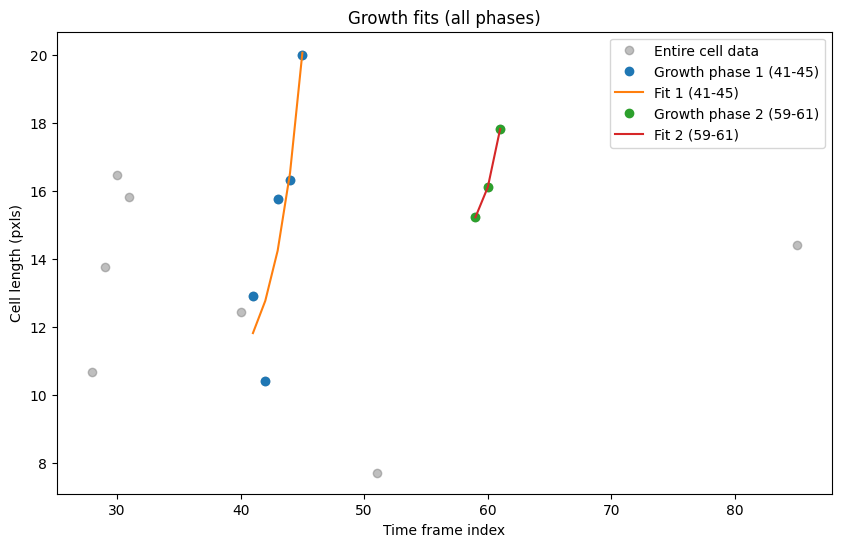

Fitting growth phase 1 from 38 to 48
  Fit parameters: A=13465.14, k=0.0000, b=-13481.17
  R-squared: 0.1165
Skipping phase 1 (38-48) due to poor fit (R-squared = 0.1165 < 0.3).
Fitting growth phase 2 from 48 to 53
  Fit parameters: A=536.51, k=0.0001, b=-526.34
  R-squared: 0.0983
Skipping phase 2 (48-53) due to poor fit (R-squared = 0.0983 < 0.3).


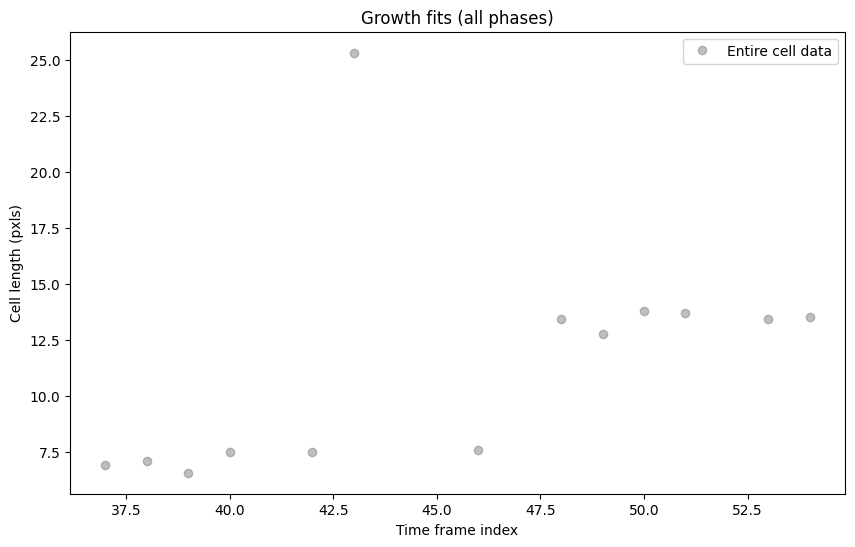

Fitting growth phase 1 from 69 to 82
  Fit parameters: A=16497.36, k=0.0000, b=-16509.40
  R-squared: 0.3666
Fitting growth phase 2 from 84 to 84
Skipping phase 2 (84-84) due to insufficient data points.
Fitting growth phase 3 from 85 to 94
Error during curve fitting: Optimal parameters not found: Number of calls to function has reached maxfev = 5000.
  Fit failed for phase 3 (85-94)


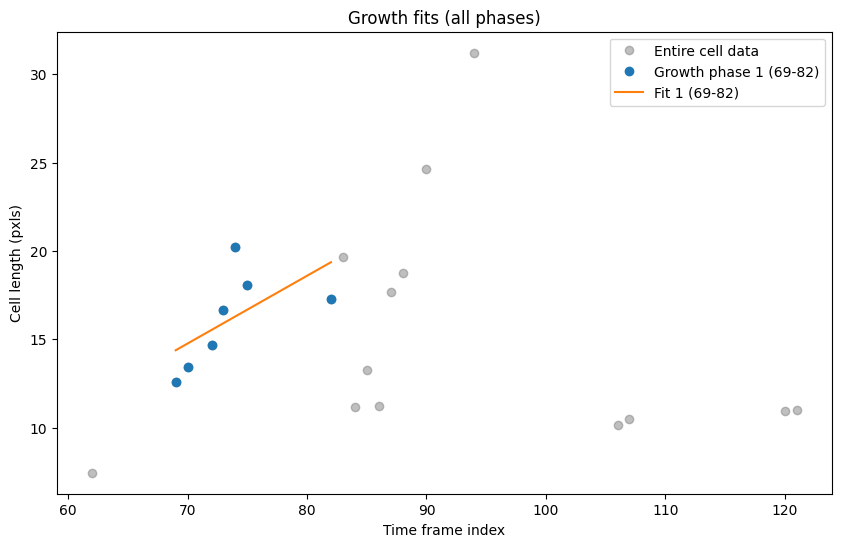

Fitting growth phase 1 from 85 to 126
  Fit parameters: A=-1523.93, k=0.0000, b=1539.32
  R-squared: 0.1230
Skipping phase 1 (85-126) due to poor fit (R-squared = 0.1230 < 0.3).


/Users/noravivancogonzalez/.pyenv/versions/3.9.6/envs/napari-env/lib/python3.9/site-packages/scipy/optimize/_minpack_py.py:881: OptimizeWarning: Covariance of the parameters could not be estimated
  warnings.warn('Covariance of the parameters could not be estimated',


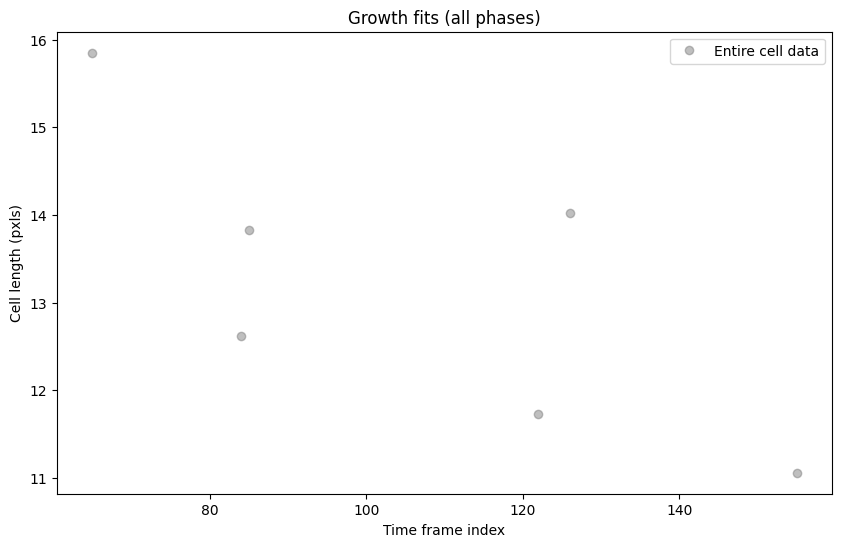

Fitting growth phase 1 from 70 to 99
  Fit parameters: A=4944.72, k=0.0000, b=-4937.05
  R-squared: 0.3673
Fitting growth phase 2 from 100 to 134
Error during curve fitting: Optimal parameters not found: Number of calls to function has reached maxfev = 5000.
  Fit failed for phase 2 (100-134)


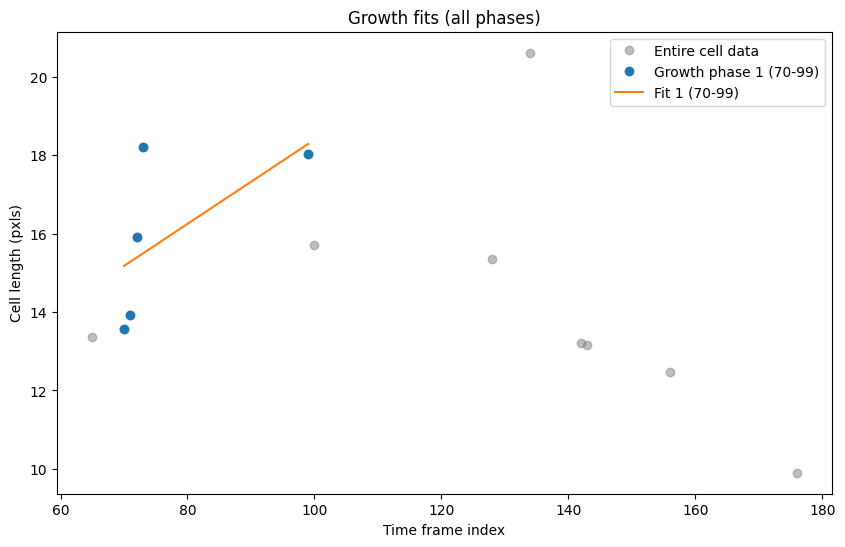

No growth phases detected.


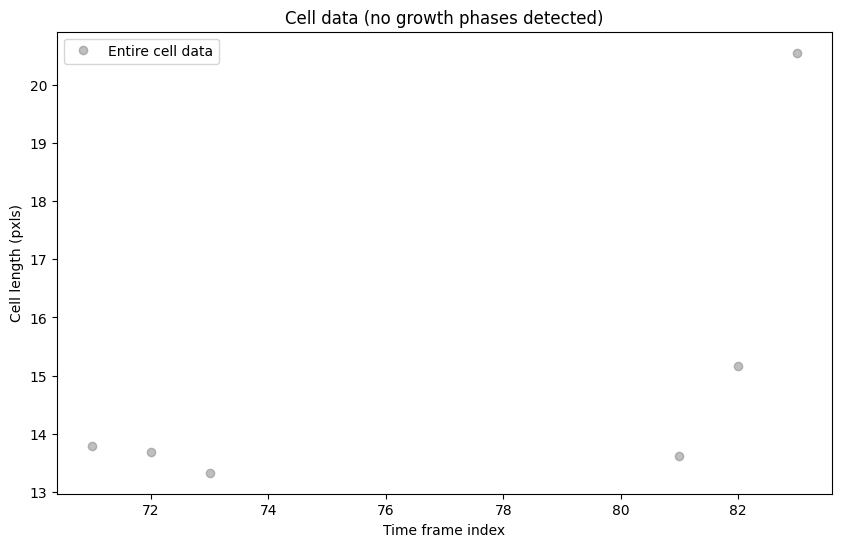

Fitting growth phase 1 from 84 to 153
  Fit parameters: A=2465.12, k=0.0000, b=-2452.65
  R-squared: 0.0114
Skipping phase 1 (84-153) due to poor fit (R-squared = 0.0114 < 0.3).


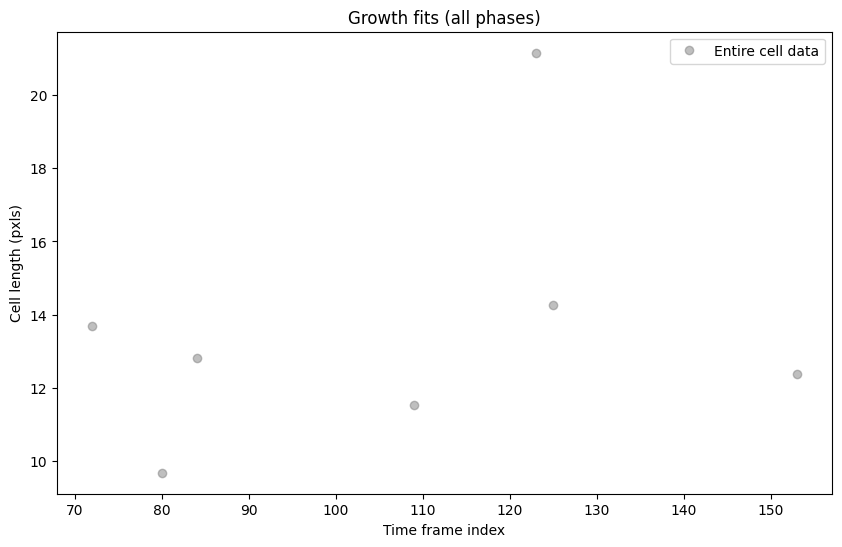

No growth phases detected.


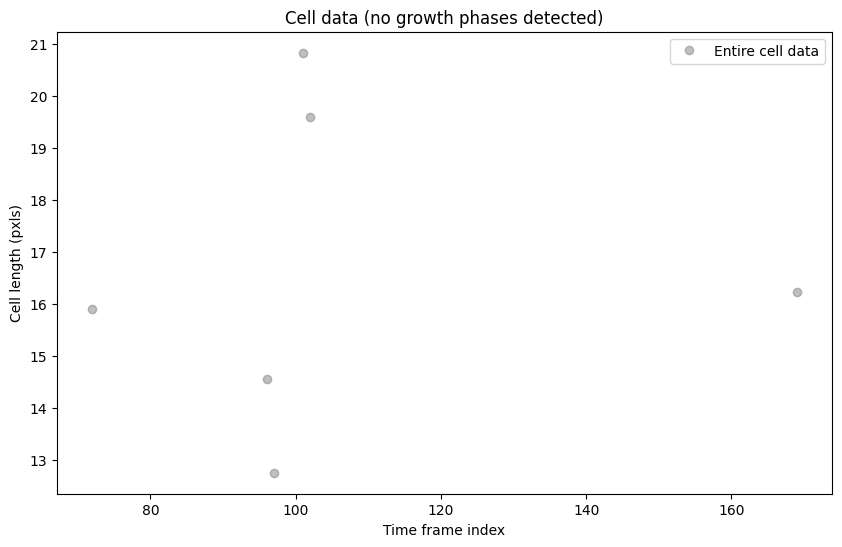

Fitting growth phase 1 from 111 to 149
  Fit parameters: A=7457.91, k=0.0000, b=-7456.54
  R-squared: 0.3471


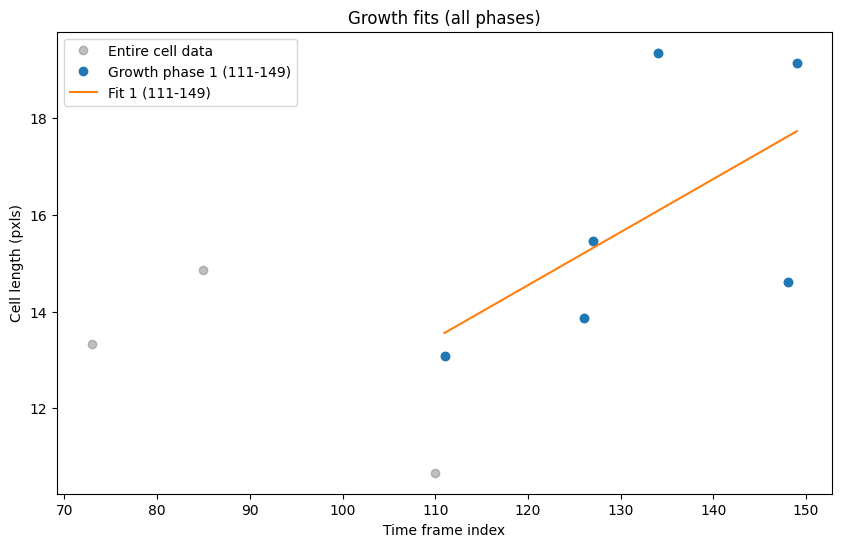

Fitting growth phase 1 from 137 to 157
  Fit parameters: A=0.00, k=0.7806, b=11.05
  R-squared: 0.9807


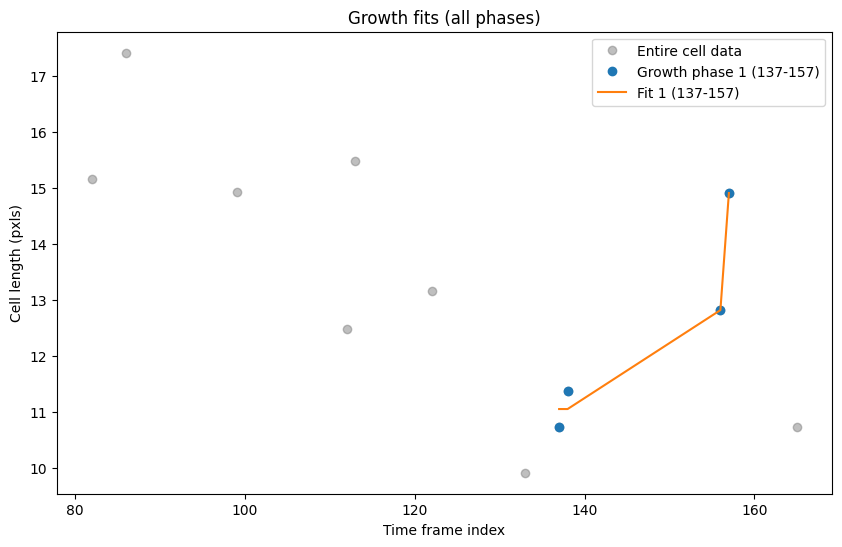

Fitting growth phase 1 from 106 to 132
  Fit parameters: A=33746.57, k=0.0000, b=-33783.26
  R-squared: 0.6176


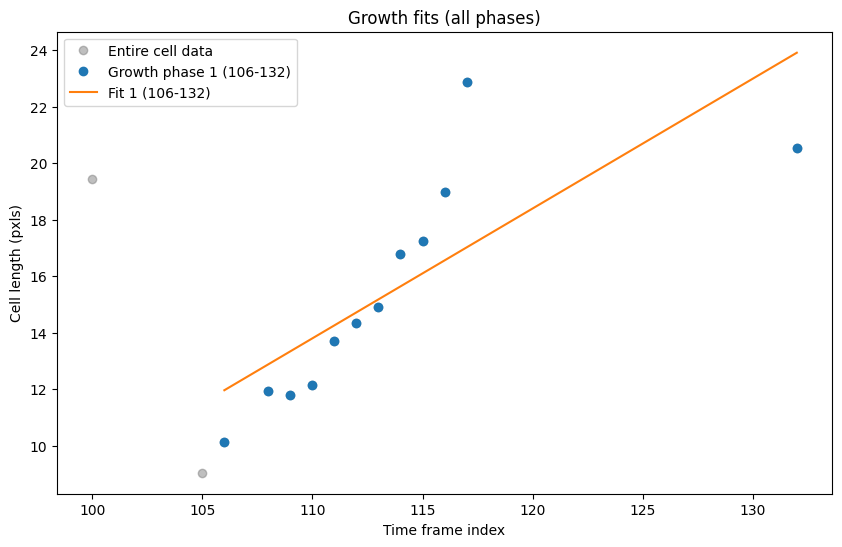

Fitting growth phase 1 from 135 to 150
  Fit parameters: A=5682.12, k=0.0000, b=-5693.09
  R-squared: 0.1954
Skipping phase 1 (135-150) due to poor fit (R-squared = 0.1954 < 0.3).
Fitting growth phase 2 from 153 to 179
  Fit parameters: A=0.00, k=0.0549, b=7.38
  R-squared: 0.8858


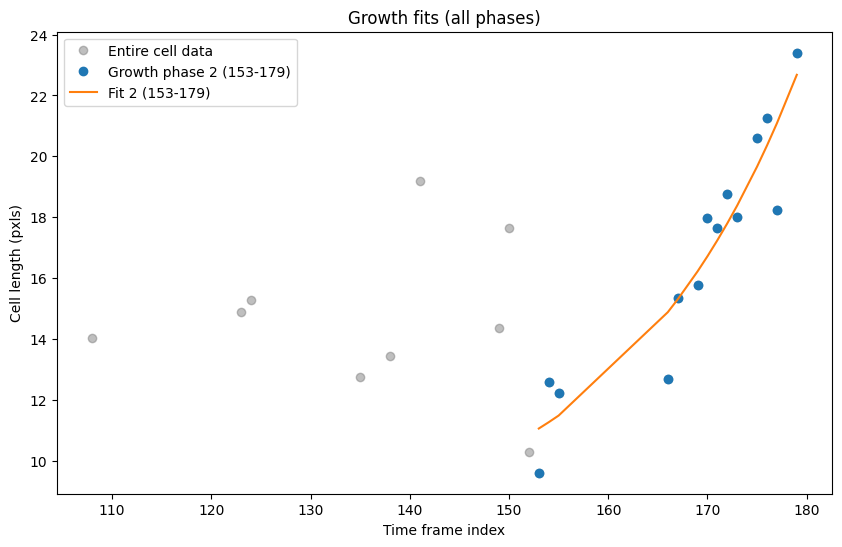

Fitting growth phase 1 from 138 to 140
Error during curve fitting: Optimal parameters not found: Number of calls to function has reached maxfev = 5000.
  Fit failed for phase 1 (138-140)
Fitting growth phase 2 from 169 to 174
Error during curve fitting: Optimal parameters not found: Number of calls to function has reached maxfev = 5000.
  Fit failed for phase 2 (169-174)


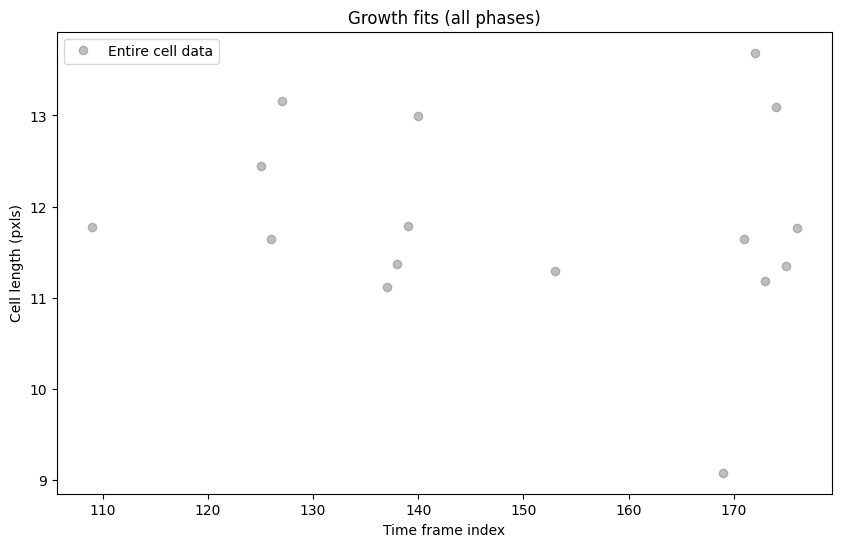

Fitting growth phase 1 from 129 to 161
  Fit parameters: A=0.00, k=0.0806, b=12.87
  R-squared: 0.8427


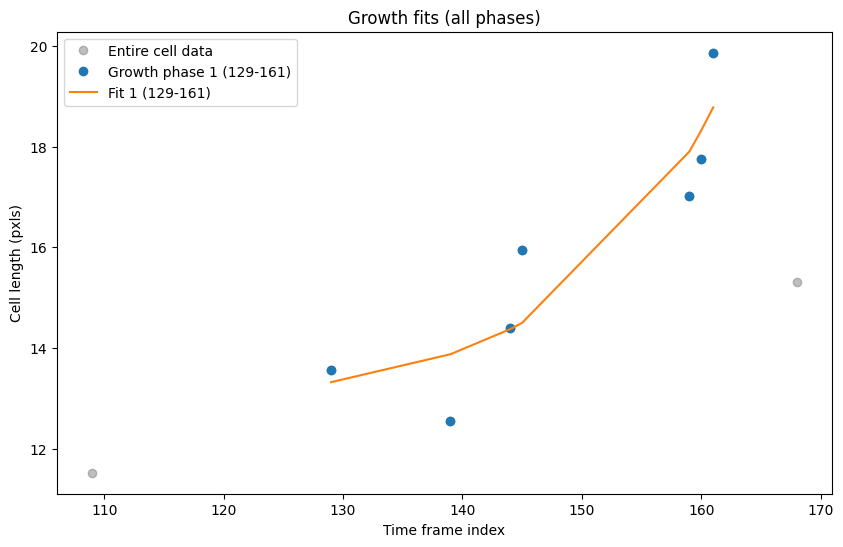

Fitting growth phase 1 from 131 to 143
  Fit parameters: A=0.00, k=0.5604, b=13.59
  R-squared: 0.9991


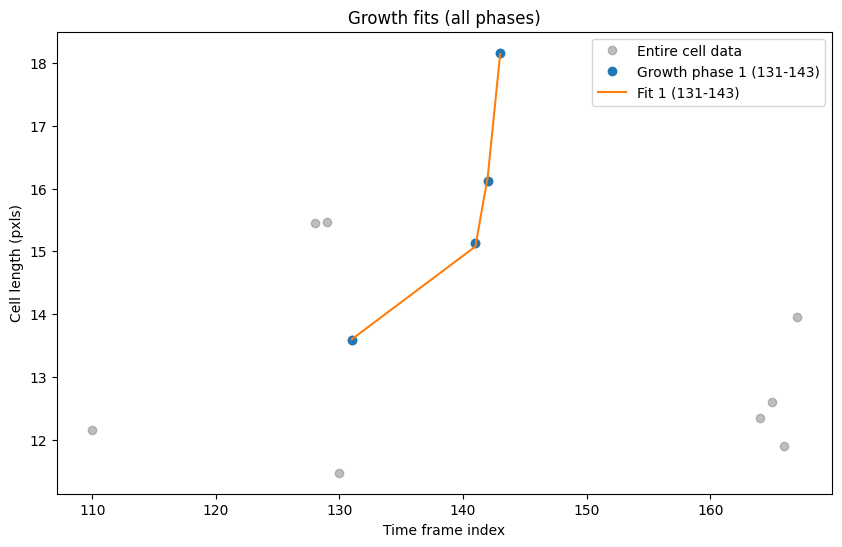

No growth phases detected.


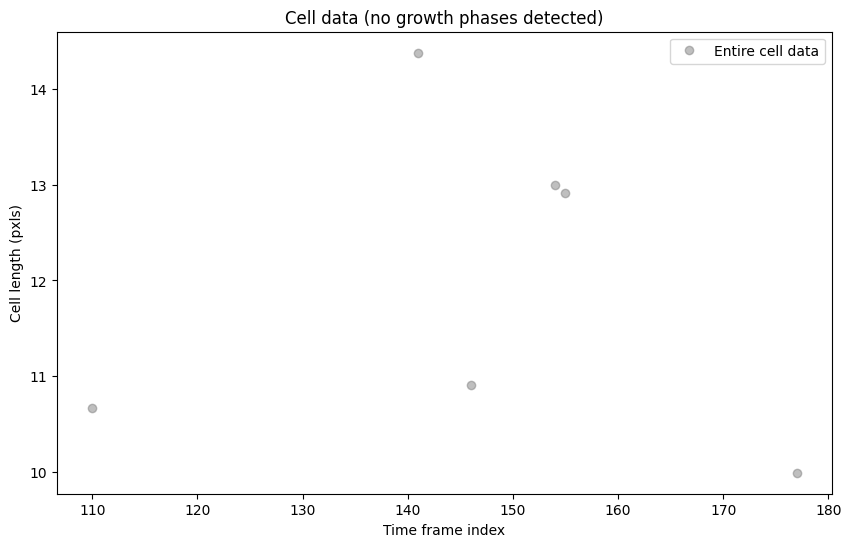

Fitting growth phase 1 from 37 to 45
  Fit parameters: A=15650.92, k=0.0000, b=-15663.65
  R-squared: 0.7039
Fitting growth phase 2 from 45 to 79
  Fit parameters: A=31036.26, k=0.0000, b=-31030.75
  R-squared: 0.5082
Fitting growth phase 3 from 83 to 120
  Fit parameters: A=7011.25, k=0.0000, b=-7002.19
  R-squared: 0.5232


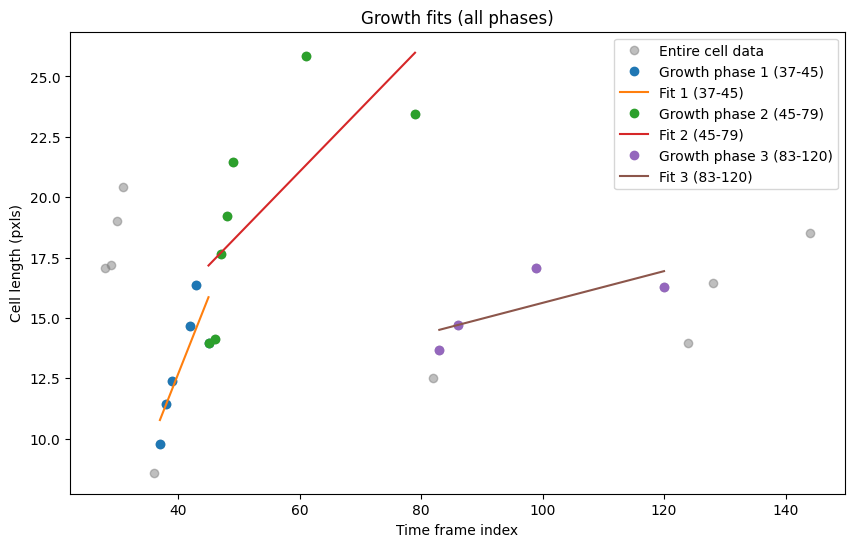

Fitting growth phase 1 from 38 to 40
Error during curve fitting: Optimal parameters not found: Number of calls to function has reached maxfev = 5000.
  Fit failed for phase 1 (38-40)
Fitting growth phase 2 from 40 to 44
Error during curve fitting: Optimal parameters not found: Number of calls to function has reached maxfev = 5000.
  Fit failed for phase 2 (40-44)
Fitting growth phase 3 from 46 to 60
  Fit parameters: A=37932.67, k=0.0000, b=-37966.22
  R-squared: 0.9202
Fitting growth phase 4 from 115 to 115
Skipping phase 4 (115-115) due to insufficient data points.


/var/folders/hj/bk95lprn3zb88y7bqhjh9j5m0000gr/T/ipykernel_6882/3010087961.py:4: RuntimeWarning: overflow encountered in exp
  return a * np.exp(b*x) + c


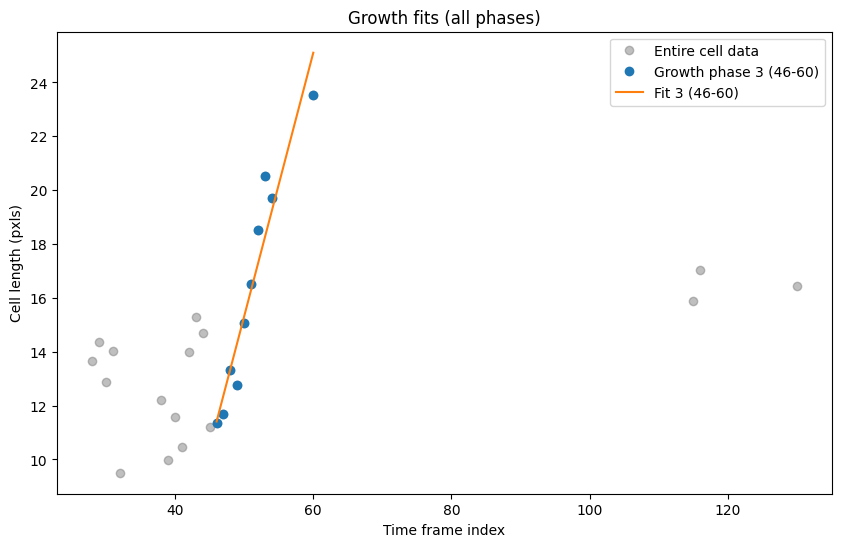

Fitting growth phase 1 from 31 to 39
  Fit parameters: A=16139.97, k=0.0001, b=-16148.78
  R-squared: 0.6443
Fitting growth phase 2 from 44 to 57
  Fit parameters: A=-0.00, k=0.4470, b=15.80
  R-squared: 0.1029
Skipping phase 2 (44-57) due to poor fit (R-squared = 0.1029 < 0.3).
Fitting growth phase 3 from 57 to 74
  Fit parameters: A=33857.98, k=0.0000, b=-33868.72
  R-squared: 0.4951
Fitting growth phase 4 from 85 to 85
Skipping phase 4 (85-85) due to insufficient data points.
Fitting growth phase 5 from 97 to 100
Error during curve fitting: Optimal parameters not found: Number of calls to function has reached maxfev = 5000.
  Fit failed for phase 5 (97-100)
Fitting growth phase 6 from 106 to 125
  Fit parameters: A=5133.94, k=0.0000, b=-5129.57
  R-squared: 0.0930
Skipping phase 6 (106-125) due to poor fit (R-squared = 0.0930 < 0.3).
Fitting growth phase 7 from 126 to 143
  Fit parameters: A=11229.66, k=0.0000, b=-11246.40
  R-squared: 0.3938


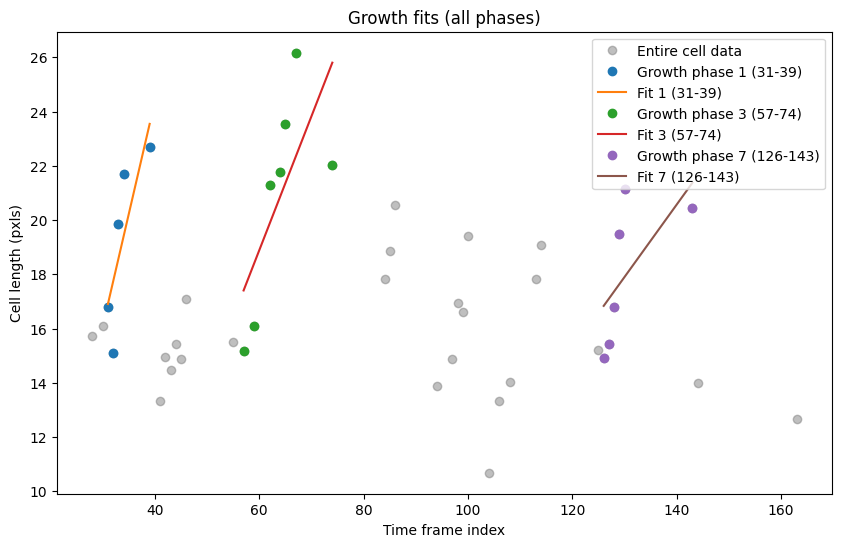

Fitting growth phase 1 from 31 to 43
  Fit parameters: A=9666.84, k=0.0001, b=-9671.44
  R-squared: 0.7624
Fitting growth phase 2 from 53 to 59
Error during curve fitting: Optimal parameters not found: Number of calls to function has reached maxfev = 5000.
  Fit failed for phase 2 (53-59)
Fitting growth phase 3 from 62 to 70
  Fit parameters: A=0.74, k=0.0600, b=-22.75
  R-squared: 0.9857


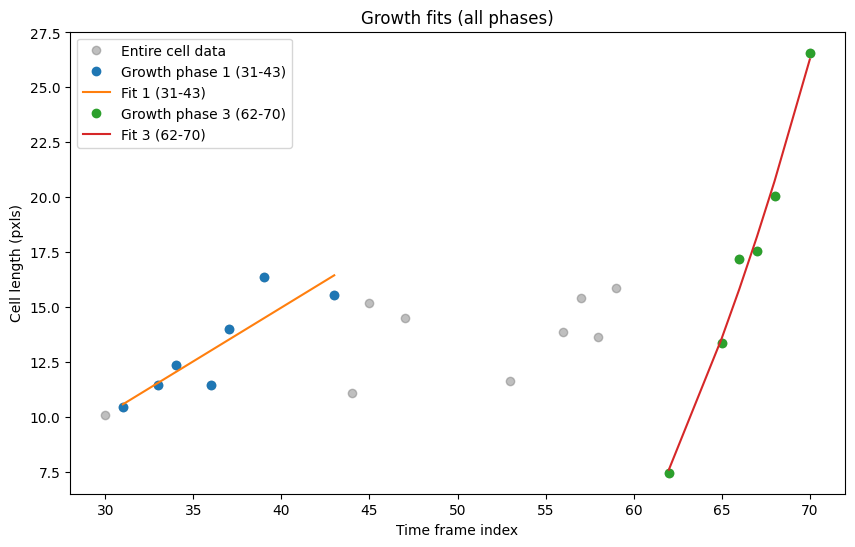

Fitting growth phase 1 from 42 to 54
  Fit parameters: A=24395.10, k=0.0000, b=-24411.47
  R-squared: 0.7085
Fitting growth phase 2 from 54 to 59
Error during curve fitting: Optimal parameters not found: Number of calls to function has reached maxfev = 5000.
  Fit failed for phase 2 (54-59)
Fitting growth phase 3 from 98 to 124
Error during curve fitting: Optimal parameters not found: Number of calls to function has reached maxfev = 5000.
  Fit failed for phase 3 (98-124)


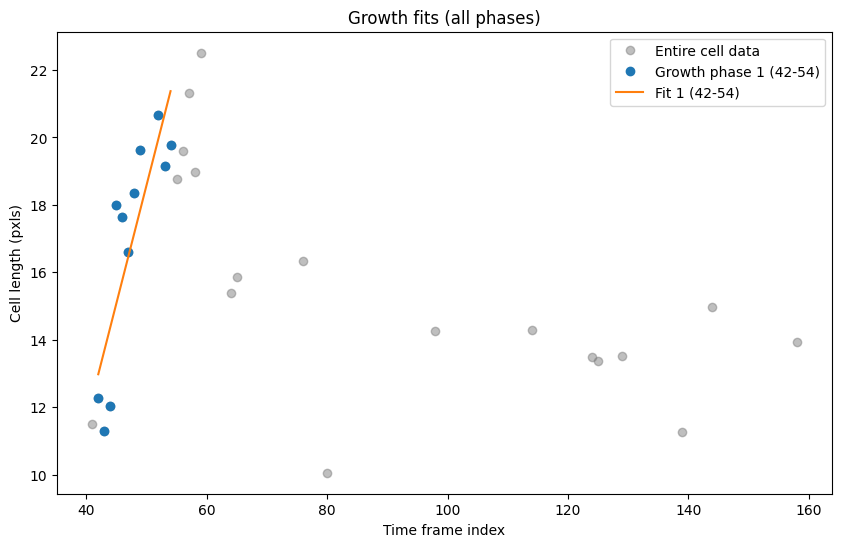

Fitting growth phase 1 from 67 to 72
  Fit parameters: A=0.00, k=0.4439, b=11.07
  R-squared: 0.7988
Fitting growth phase 2 from 82 to 97
  Fit parameters: A=0.00, k=0.0944, b=7.52
  R-squared: 0.9739


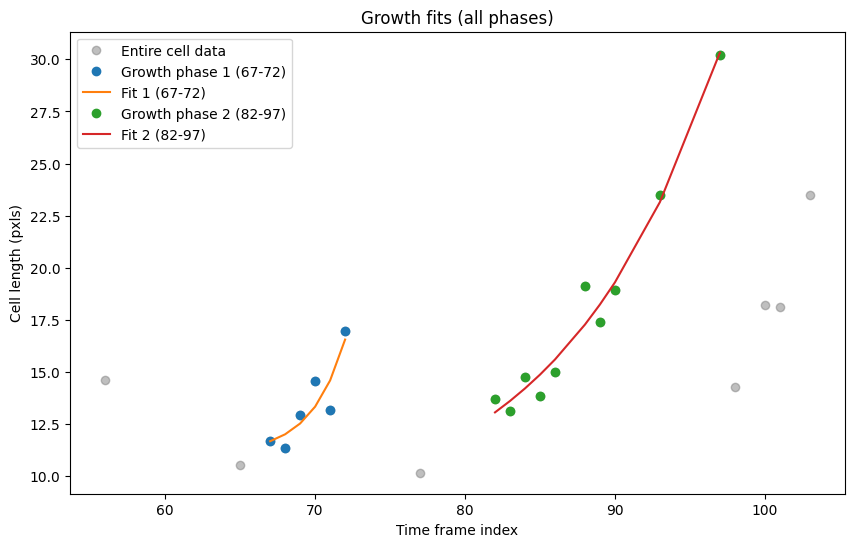

Fitting growth phase 1 from 106 to 118
  Fit parameters: A=9613.65, k=0.0000, b=-9633.62
  R-squared: 0.1512
Skipping phase 1 (106-118) due to poor fit (R-squared = 0.1512 < 0.3).
Fitting growth phase 2 from 121 to 144
Error during curve fitting: Optimal parameters not found: Number of calls to function has reached maxfev = 5000.
  Fit failed for phase 2 (121-144)
Fitting growth phase 3 from 153 to 153
Skipping phase 3 (153-153) due to insufficient data points.


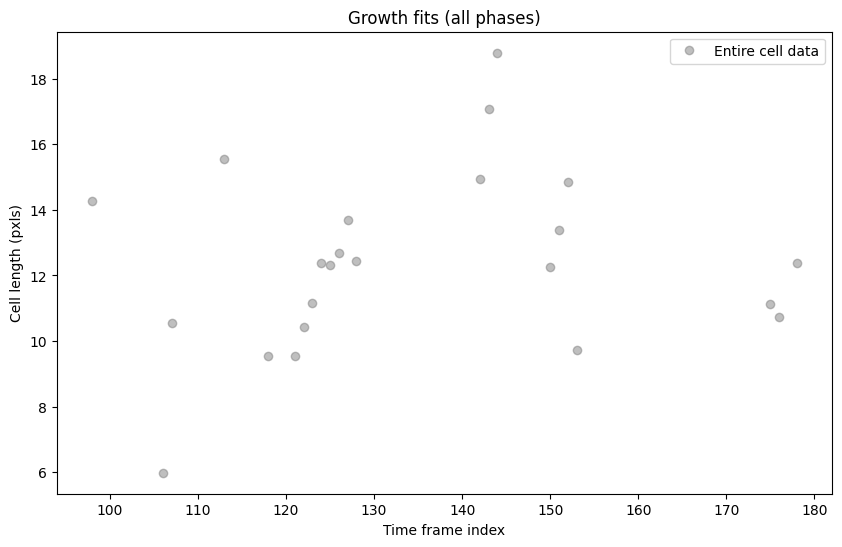

Fitting growth phase 1 from 148 to 154
  Fit parameters: A=0.00, k=0.3181, b=10.31
  R-squared: 0.9010
Fitting growth phase 2 from 160 to 175
Error during curve fitting: Optimal parameters not found: Number of calls to function has reached maxfev = 5000.
  Fit failed for phase 2 (160-175)


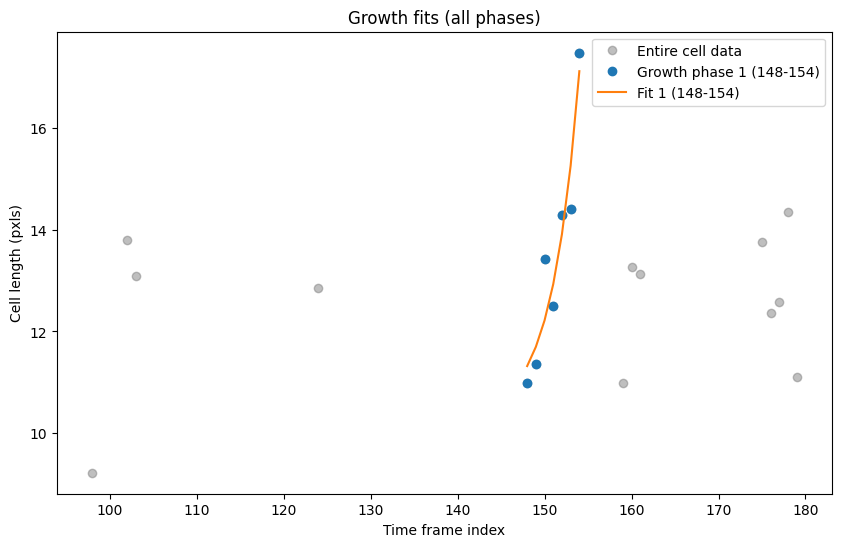

Fitting growth phase 1 from 32 to 34
Error during curve fitting: Optimal parameters not found: Number of calls to function has reached maxfev = 5000.
  Fit failed for phase 1 (32-34)
Fitting growth phase 2 from 34 to 41
  Fit parameters: A=9376.67, k=0.0001, b=-9391.80
  R-squared: 0.8194


/var/folders/hj/bk95lprn3zb88y7bqhjh9j5m0000gr/T/ipykernel_6882/3010087961.py:4: RuntimeWarning: overflow encountered in exp
  return a * np.exp(b*x) + c


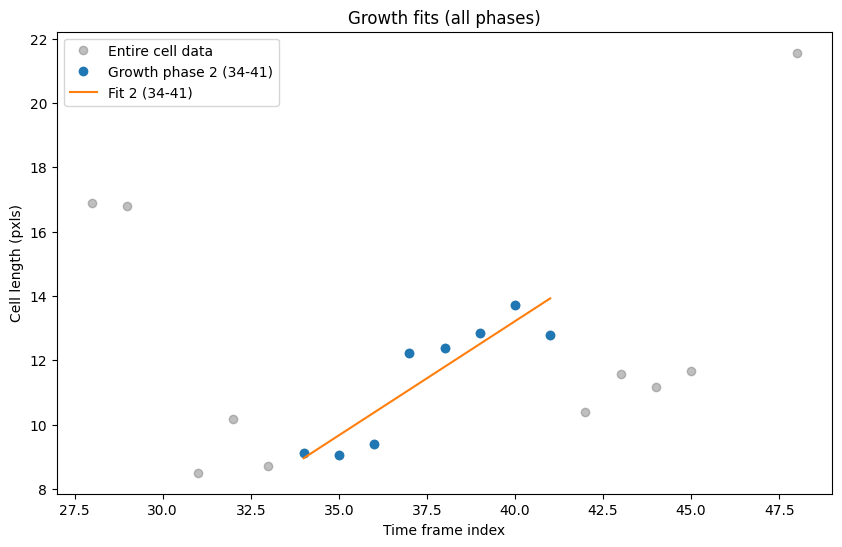

Fitting growth phase 1 from 38 to 49
  Fit parameters: A=0.00, k=0.3697, b=8.41
  R-squared: 0.9178
Fitting growth phase 2 from 51 to 61
  Fit parameters: A=0.00, k=0.1969, b=8.98
  R-squared: 0.9662


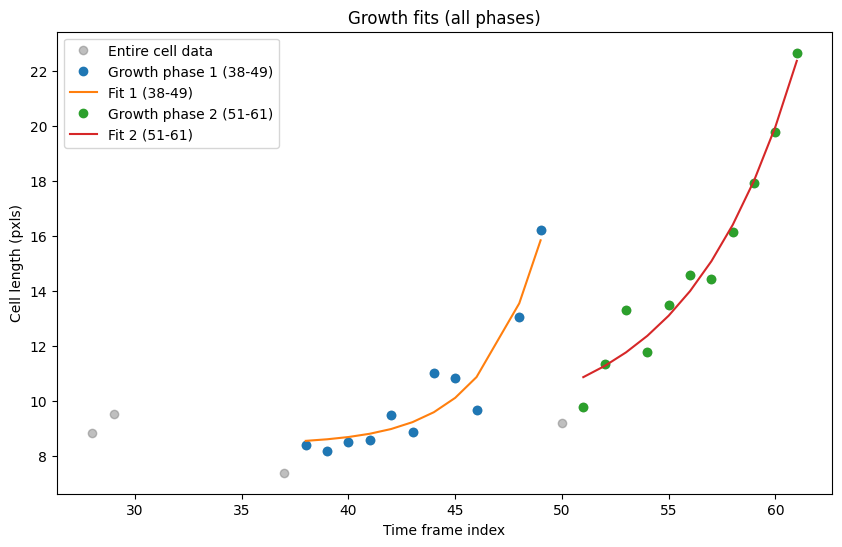

Fitting growth phase 1 from 29 to 36
  Fit parameters: A=0.01, k=0.1971, b=8.27
  R-squared: 0.9722
Fitting growth phase 2 from 43 to 47
  Fit parameters: A=4536.54, k=0.0001, b=-4533.35
  R-squared: 0.5142
Fitting growth phase 3 from 75 to 100
  Fit parameters: A=28569.59, k=0.0000, b=-28582.91
  R-squared: 0.5191
Fitting growth phase 4 from 107 to 113
  Fit parameters: A=0.00, k=0.5581, b=15.18
  R-squared: 0.9370
Fitting growth phase 5 from 122 to 126
Error during curve fitting: Optimal parameters not found: Number of calls to function has reached maxfev = 5000.
  Fit failed for phase 5 (122-126)
Fitting growth phase 6 from 135 to 139
Error during curve fitting: Optimal parameters not found: Number of calls to function has reached maxfev = 5000.
  Fit failed for phase 6 (135-139)
Fitting growth phase 7 from 148 to 152
Error during curve fitting: Optimal parameters not found: Number of calls to function has reached maxfev = 5000.
  Fit failed for phase 7 (148-152)


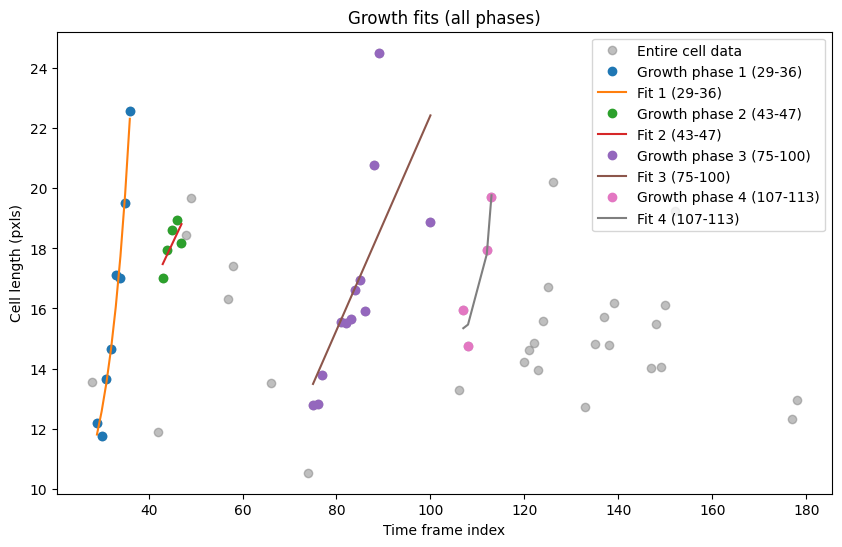

No growth phases detected.


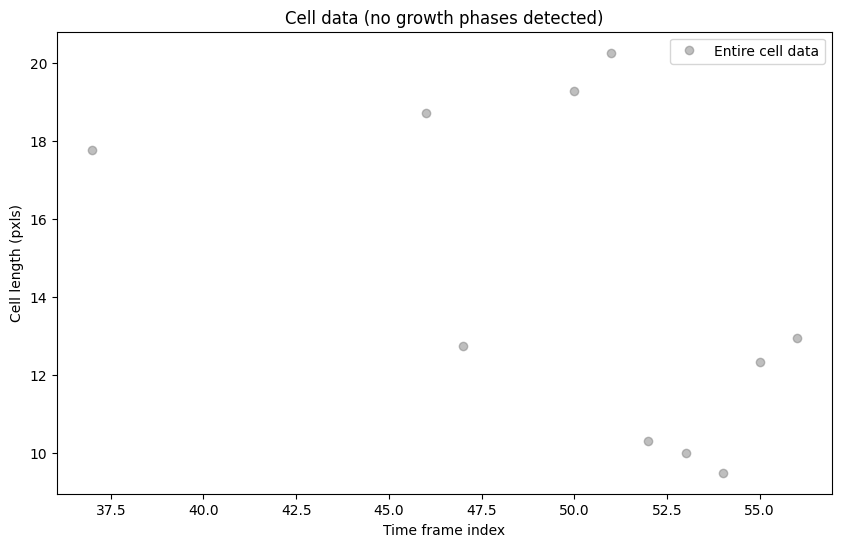

Fitting growth phase 1 from 99 to 129
Error during curve fitting: Optimal parameters not found: Number of calls to function has reached maxfev = 5000.
  Fit failed for phase 1 (99-129)
Fitting growth phase 2 from 133 to 141
Error during curve fitting: Optimal parameters not found: Number of calls to function has reached maxfev = 5000.
  Fit failed for phase 2 (133-141)
Fitting growth phase 3 from 141 to 149
  Fit parameters: A=0.00, k=0.1975, b=9.96
  R-squared: 0.9280


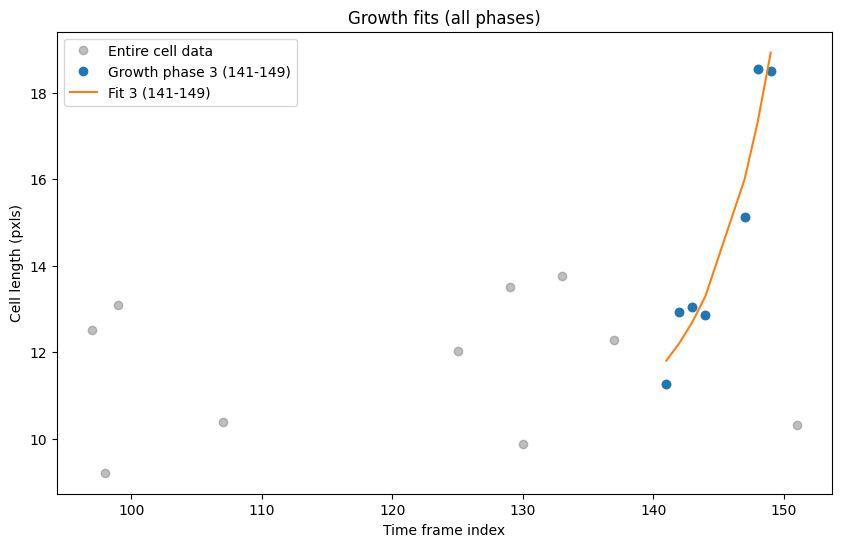

In [201]:
growth_all_cells_pd = pd.DataFrame()
for cell_id in all_cells_pd['cell_id'].unique():
    cell_df = all_cells_pd[all_cells_pd['cell_id'] == cell_id]
    growth_det = plot_growth_analysis(cell_df, 'time_index', 'lengths_(pxls)', prominence=0.5, distance=4, window_size=3)
    if growth_all_cells_pd.empty:
        growth_all_cells_pd = growth_det 
    else:
        growth_all_cells_pd = pd.concat([growth_all_cells_pd, growth_det], ignore_index=True)

# Let's call the fits good enough...cluster based on residuals

In [202]:
cells_to_cluster_df = growth_all_cells_pd.dropna(subset=['residuals'])

# separately process each growth phase

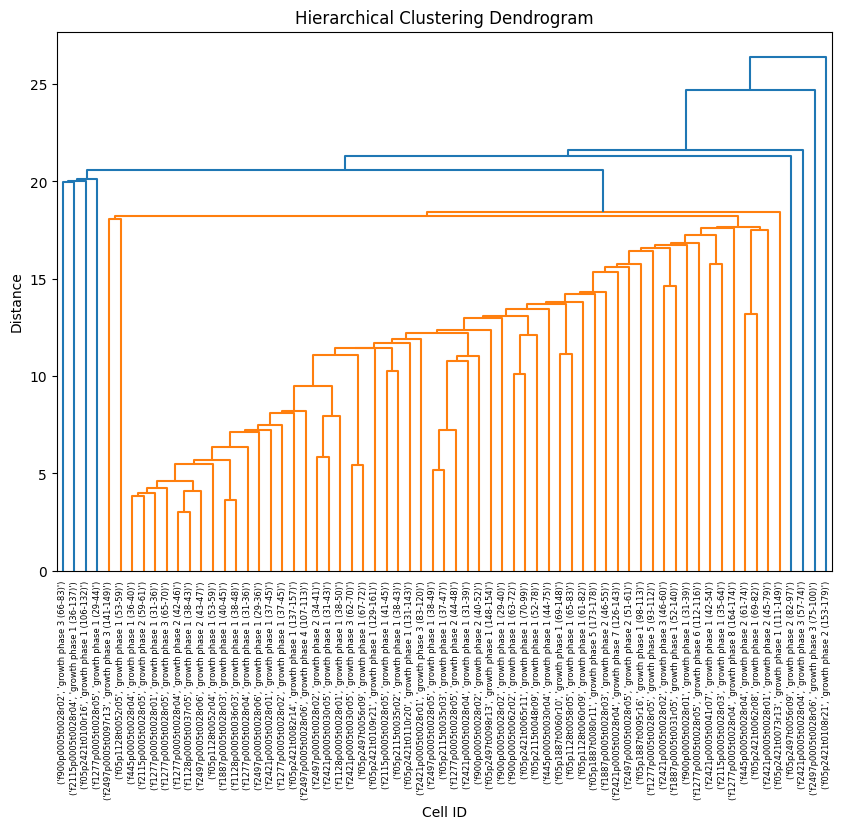

In [207]:
linked_matrix, cell_ids, dendrogram_fig, dendrogram_ax = cluster_growth_traces(cells_to_cluster_df, 'cell_id', 'growth_phase', 'time_index', 'residuals', method='ward', metric='euclidean')

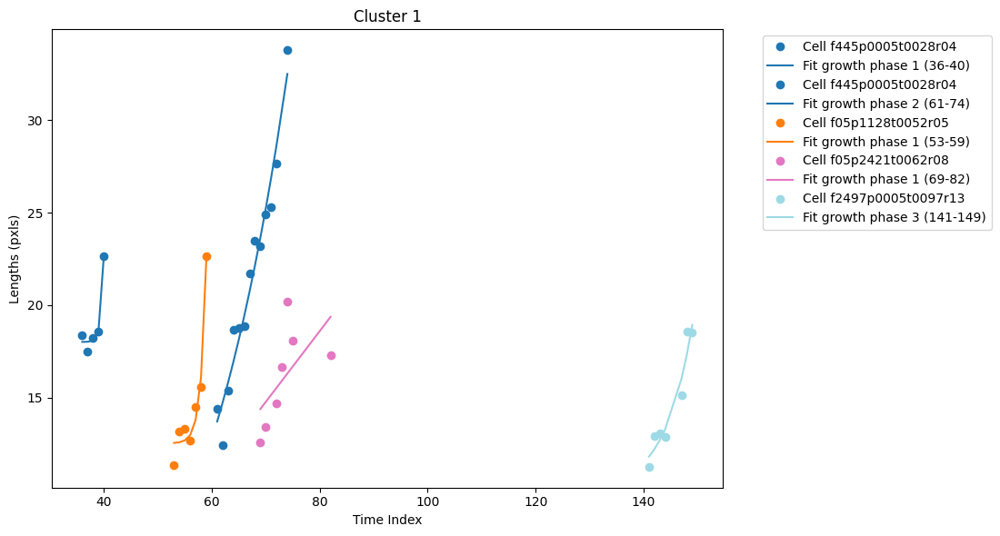

/var/folders/hj/bk95lprn3zb88y7bqhjh9j5m0000gr/T/ipykernel_6882/1391988016.py:25: UserWarning: Tight layout not applied. The bottom and top margins cannot be made large enough to accommodate all axes decorations.
  plt.tight_layout()


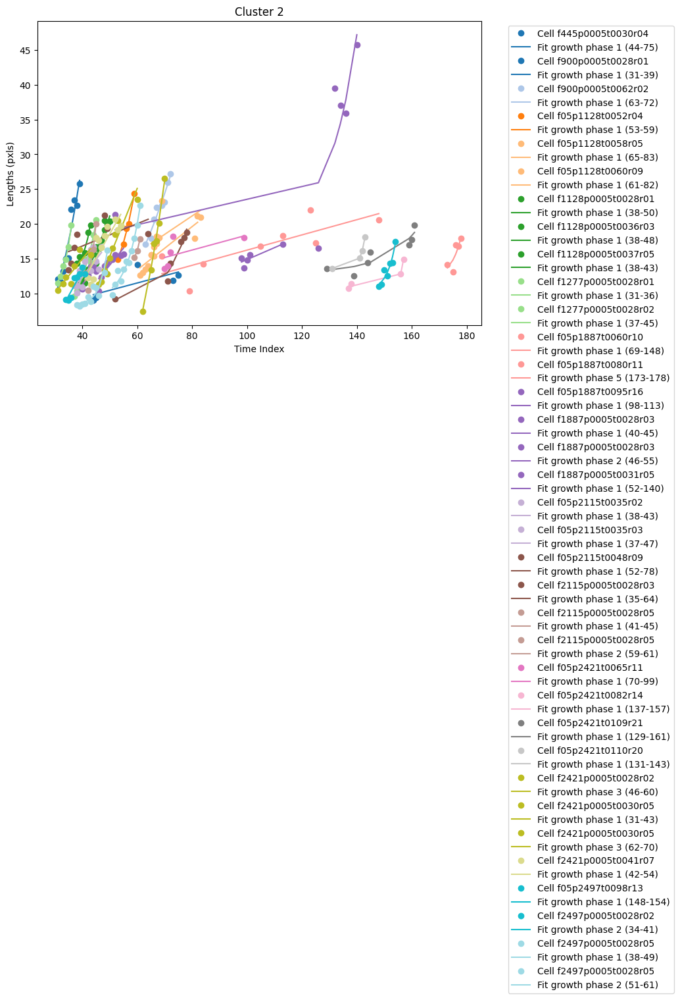

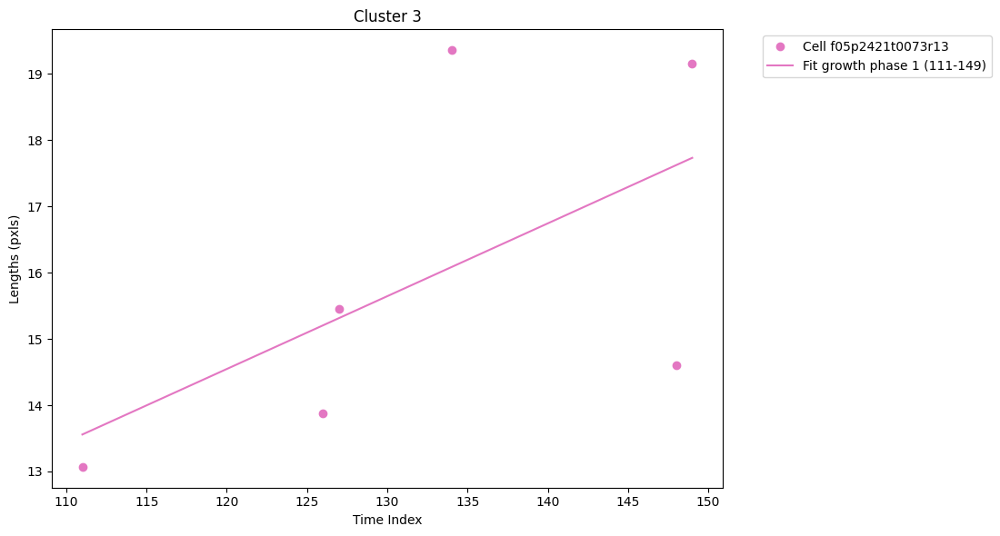

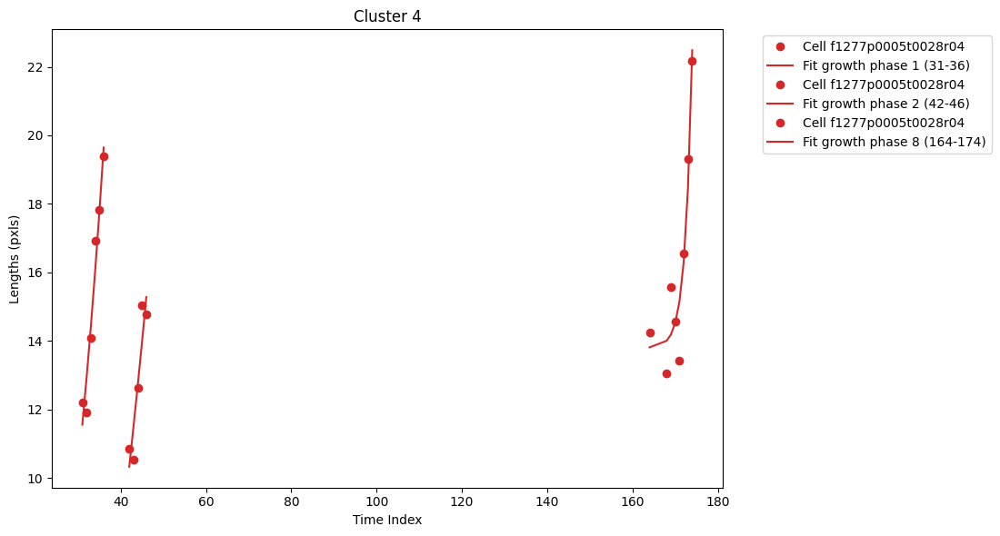

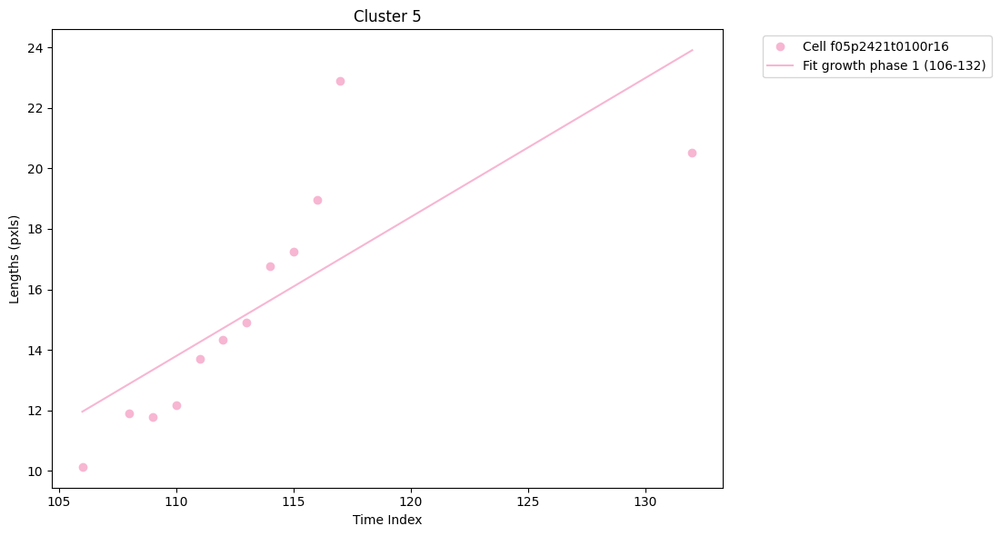

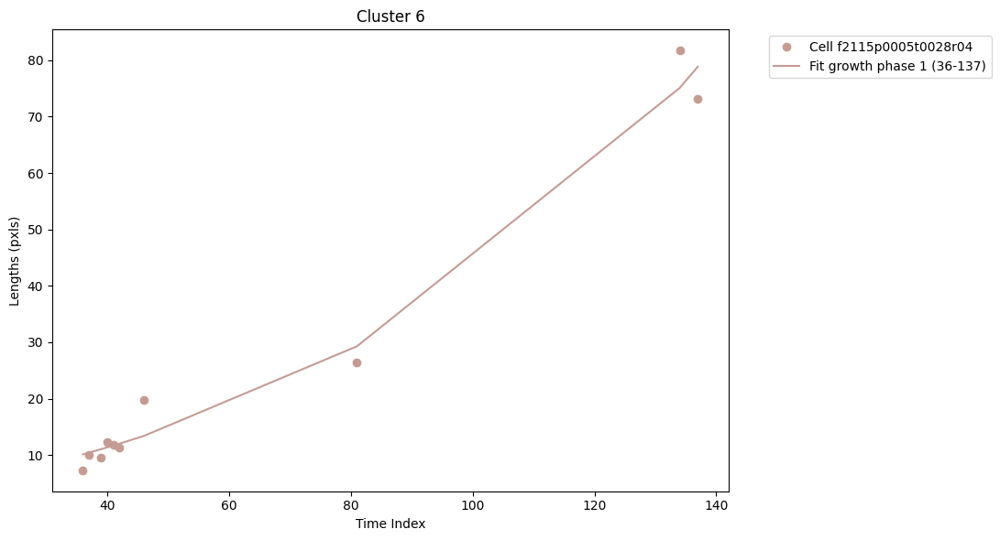

...

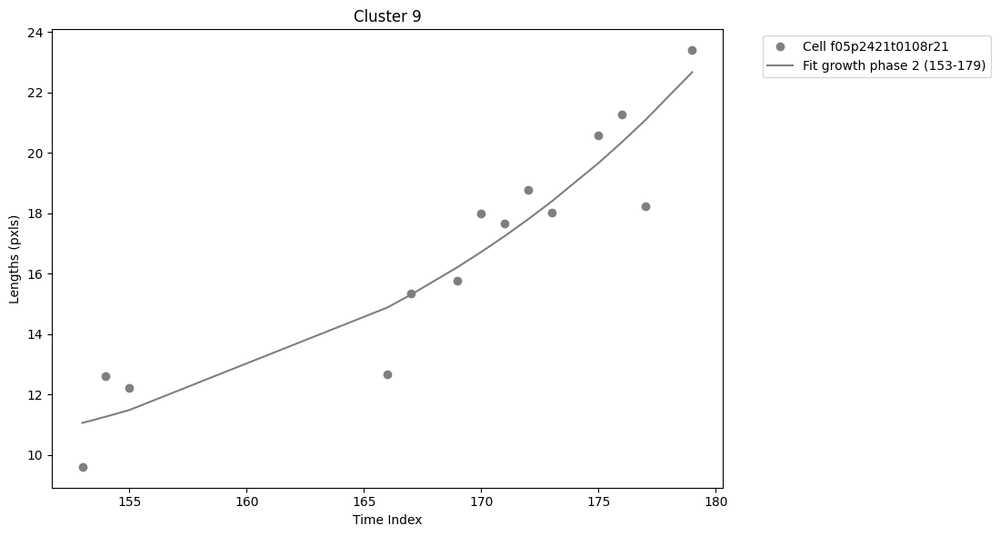

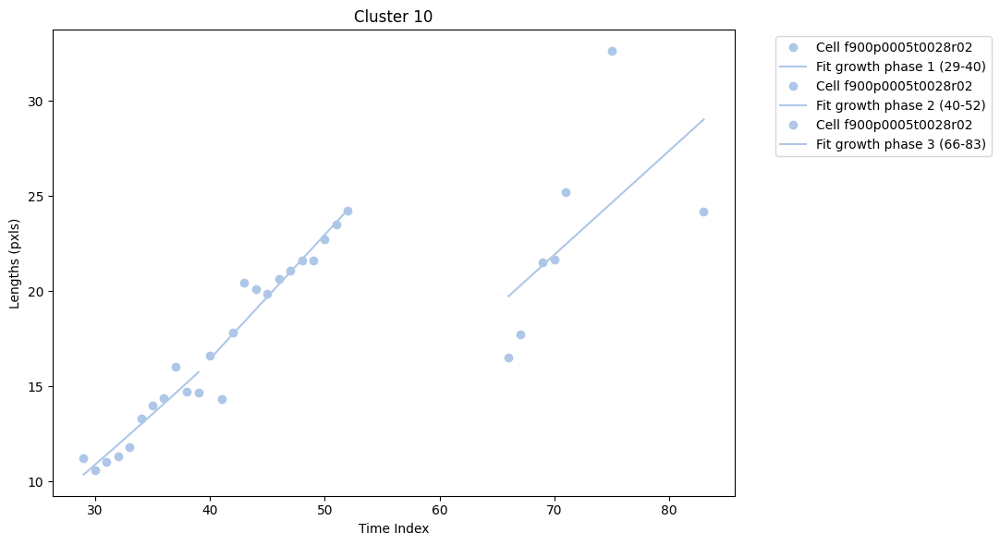

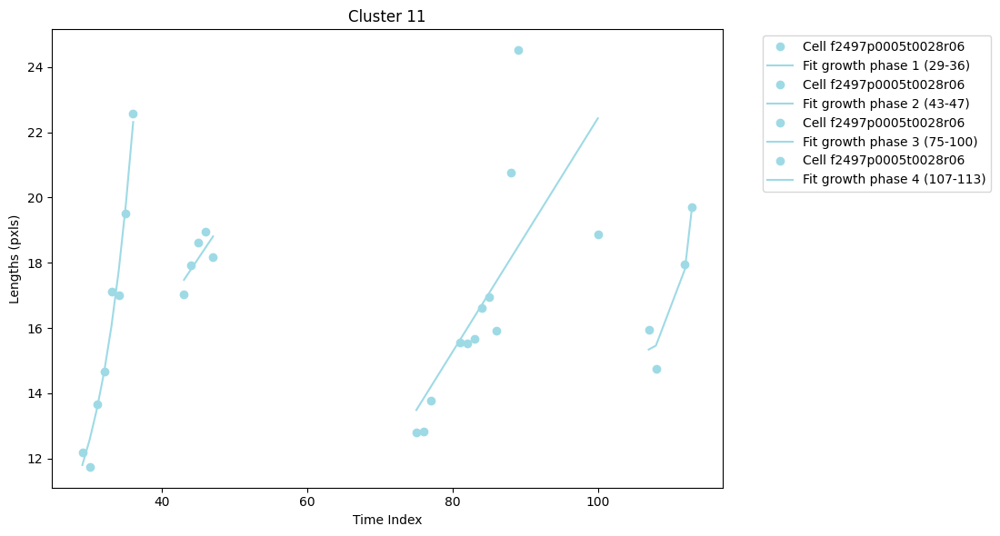

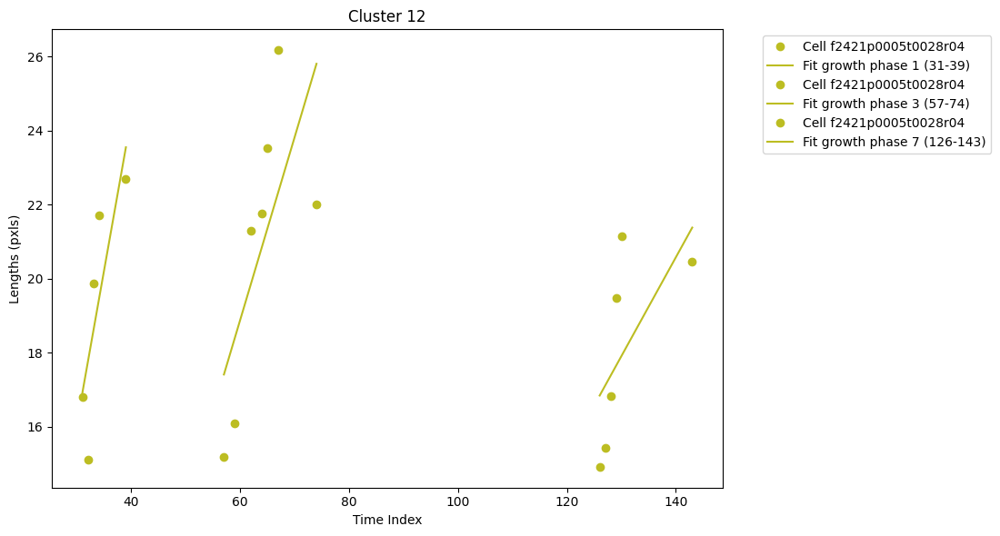

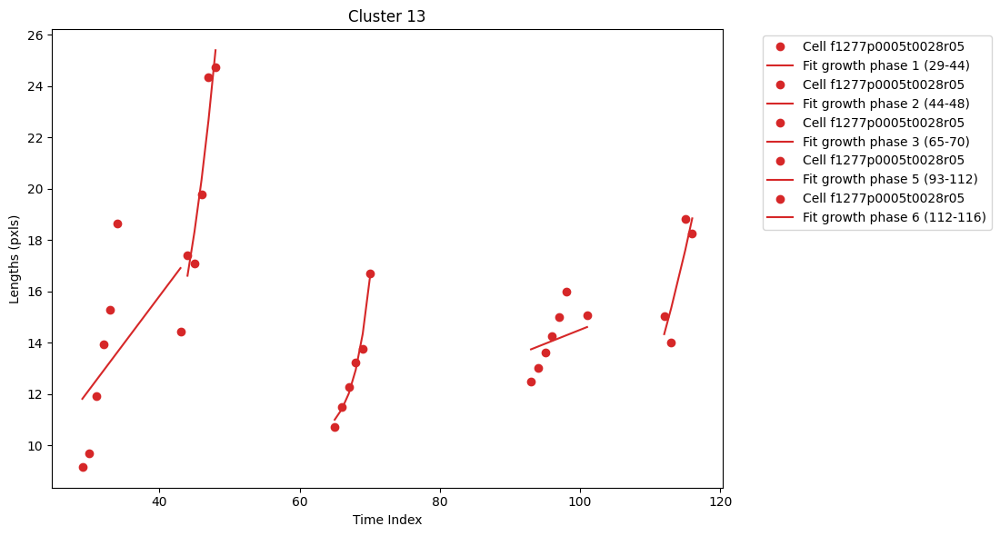

In [217]:
if linked_matrix is not None:
    # Dendrogram with threshold lines
    dendrogram_dict = dendrogram(linked_matrix, orientation='top', labels=cell_ids, 
                                 distance_sort='descending', show_leaf_counts=True,  
                                 get_leaves=True, ax=dendrogram_ax)
    clusters = fcluster(linked_matrix, t=15, criterion='distance')
    all_cells_clustered = pd.merge(cells_to_cluster_df, cluster_df, on='cell_id', how='left')
    cell_colors = cell_color_dict(all_cells_clustered)

    for cluster_id in np.unique(clusters):
        cluster_data = all_cells_clustered[all_cells_clustered['cluster'] == cluster_id]
        if not cluster_data.empty:
            plt.figure(figsize=(10, 6))  # Adjust size
            for cell_id in cluster_data['cell_id'].unique():
                cell_data = cluster_data[cluster_data['cell_id'] == cell_id]
                for growth_phase_id in cell_data['growth_phase'].unique():
                    growth_df = cell_data[cell_data['growth_phase'] == growth_phase_id].copy()
                    plt.plot(growth_df['time_index'], growth_df['lengths_(pxls)'], 'o', label=f"Cell {cell_id}", color = cell_colors[cell_id])
                    plt.plot(growth_df['time_index'], growth_df['y_fit'], '-', label=f'Fit {growth_phase_id}', color = cell_colors[cell_id])
    
            plt.title(f"Cluster {cluster_id}")
            plt.xlabel("Time Index")
            plt.ylabel("Lengths (pxls)")
            plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left')  # Place legend outside plot
            plt.tight_layout()
            plt.subplots_adjust(right=0.8) # Adjust layout for external legend
            plt.show()

else:
    print("Clustering failed. Check your data.")

In [213]:
all_cells_clustered[all_cells_clustered['cell_id'] == 'f2497p0005t0028r06']

,cell_id,time_index,is_active,daughters,parent,labels,bboxes,areas_(pxls^2),lengths_(pxls),widths_(pxls),...,centroids,fl_area_avgs,experiment,FOV,peak_id,y_fit,residuals,r_squared,growth_phase,cluster
453,f2497p0005t0028r06,29,True,"(f05p2497t0098r13, f05p2497t0098r12)",None,6,"(239, 5, 274, 15)",303.0,12.187500,4.375000,...,"(256.5, 9.86)",0.0,DUMM_giTG62_Glucose_012925,005,2497,11.803331,0.384169,0.972162,growth phase 1 (29-36),11
454,f2497p0005t0028r06,30,True,"(f05p2497t0098r13, f05p2497t0098r12)",None,6,"(235, 5, 273, 16)",309.0,11.750000,4.101562,...,"(254.9, 10.21)",0.0,DUMM_giTG62_Glucose_012925,005,2497,12.573434,-0.823434,0.972162,growth phase 1 (29-36),11
455,f2497p0005t0028r06,31,True,"(f05p2497t0098r13, f05p2497t0098r12)",None,6,"(232, 4, 273, 15)",379.0,13.656250,4.886719,...,"(252.0, 9.07)",0.0,DUMM_giTG62_Glucose_012925,005,2497,13.511355,0.144895,0.972162,growth phase 1 (29-36),11
456,f2497p0005t0028r06,32,True,"(f05p2497t0098r13, f05p2497t0098r12)",None,6,"(231, 6, 274, 16)",377.0,14.664062,4.726562,...,"(252.2, 10.516)",0.0,DUMM_giTG62_Glucose_012925,005,2497,14.653665,0.010397,0.972162,growth phase 1 (29-36),11
457,f2497p0005t0028r06,33,True,"(f05p2497t0098r13, f05p2497t0098r12)",None,6,"(228, 4, 274, 15)",442.0,17.125000,4.968750,...,"(249.9, 9.04)",0.0,DUMM_giTG62_Glucose_012925,005,2497,16.044904,1.080096,0.972162,growth phase 1 (29-36),11
458,f2497p0005t0028r06,34,True,"(f05p2497t0098r13, f05p2497t0098r12)",None,6,"(225, 4, 272, 15)",435.0,17.000000,5.078125,...,"(248.2, 9.48)",0.0,DUMM_giTG62_Glucose_012925,005,2497,17.739318,-0.739318,0.972162,growth phase 1 (29-36),11
459,f2497p0005t0028r06,35,True,"(f05p2497t0098r13, f05p2497t0098r12)",None,6,"(222, 4, 273, 15)",446.0,19.500000,5.222656,...,"(246.8, 9.4)",0.0,DUMM_giTG62_Glucose_012925,005,2497,19.802973,-0.302973,0.972162,growth phase 1 (29-36),11
460,f2497p0005t0028r06,36,True,"(f05p2497t0098r13, f05p2497t0098r12)",None,6,"(218, 4, 273, 15)",470.0,22.562500,5.550781,...,"(244.8, 8.734)",0.0,DUMM_giTG62_Glucose_012925,005,2497,22.316333,0.246167,0.972162,growth phase 1 (29-36),11
461,f2497p0005t0028r06,43,True,"(f05p2497t0098r13, f05p2497t0098r12)",None,6,"(233, 4, 278, 15)",338.0,17.031250,4.382812,...,"(256.2, 9.86)",0.0,DUMM_giTG62_Glucose_012925,005,2497,17.478211,-0.446961,0.514183,growth phase 2 (43-47),11
462,f2497p0005t0028r06,44,True,"(f05p2497t0098r13, f05p2497t0098r12)",None,6,"(231, 4, 278, 15)",352.0,17.937500,5.433594,...,"(255.6, 9.79)",0.0,DUMM_giTG62_Glucose_012925,005,2497,17.810956,0.126544,0.514183,growth phase 2 (43-47),11


In [216]:
all_cells_clustered[all_cells_clustered['cluster'] == 1]

,cell_id,time_index,is_active,daughters,parent,labels,bboxes,areas_(pxls^2),lengths_(pxls),widths_(pxls),...,centroids,fl_area_avgs,experiment,FOV,peak_id,y_fit,residuals,r_squared,growth_phase,cluster
0,f445p0005t0028r04,36,False,None,None,5,"(229, 5, 281, 15)",353.0,18.381347,4.665641,...,"(255.9943342776204, 9.88385269121813)",0.000000,DUMM_giTG62_Glucose_012925,005,445,18.009388,0.371959,0.974985,growth phase 1 (36-40),1
1,f445p0005t0028r04,37,False,None,None,5,"(229, 6, 280, 16)",394.0,17.510247,4.590966,...,"(255.4289340101523, 10.98477157360406)",0.000000,DUMM_giTG62_Glucose_012925,005,445,18.016783,-0.506536,0.974985,growth phase 1 (36-40),1
2,f445p0005t0028r04,38,False,None,None,5,"(226, 6, 282, 16)",424.0,18.228217,4.477840,...,"(255.18632075471697, 10.93867924528302)",0.000000,DUMM_giTG62_Glucose_012925,005,445,18.077418,0.150800,0.974985,growth phase 1 (36-40),1
3,f445p0005t0028r04,39,False,None,None,5,"(222, 6, 280, 16)",425.0,18.557722,4.331276,...,"(252.01176470588234, 10.774117647058823)",0.000000,DUMM_giTG62_Glucose_012925,005,445,18.574597,-0.016875,0.974985,growth phase 1 (36-40),1
4,f445p0005t0028r04,40,False,None,None,5,"(216, 5, 273, 15)",377.0,22.651922,4.901747,...,"(245.81697612732094, 9.607427055702917)",0.000000,DUMM_giTG62_Glucose_012925,005,445,22.651270,0.000652,0.974985,growth phase 1 (36-40),1
5,f445p0005t0028r04,61,False,None,None,6,"(239, 0, 279, 10)",317.0,14.409144,4.005178,...,"(257.90536277602524, 4.441640378548896)",14.731861,DUMM_giTG62_Glucose_012925,005,445,13.705133,0.704012,0.956945,growth phase 2 (61-74),1
6,f445p0005t0028r04,62,False,None,None,6,"(237, 1, 275, 10)",245.0,12.404638,4.050405,...,"(255.33061224489796, 5.220408163265306)",21.559184,DUMM_giTG62_Glucose_012925,005,445,14.720773,-2.316135,0.956945,growth phase 2 (61-74),1
7,f445p0005t0028r04,63,False,None,None,6,"(233, 2, 276, 12)",299.0,15.373217,3.938650,...,"(253.87959866220737, 5.829431438127091)",0.000000,DUMM_giTG62_Glucose_012925,005,445,15.794163,-0.420946,0.956945,growth phase 2 (61-74),1
8,f445p0005t0028r04,64,False,None,None,6,"(231, 2, 276, 11)",314.0,18.644458,4.707751,...,"(252.27070063694268, 5.6210191082802545)",0.000000,DUMM_giTG62_Glucose_012925,005,445,16.928587,1.715871,0.956945,growth phase 2 (61-74),1
9,f445p0005t0028r04,65,False,None,None,6,"(228, 2, 276, 12)",319.0,18.748195,5.522299,...,"(250.4796238244514, 5.598746081504702)",14.134796,DUMM_giTG62_Glucose_012925,005,445,18.127515,0.620680,0.956945,growth phase 2 (61-74),1
